In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset,TensorDataset
from autoencoder2 import Autoencoder2, reduce_dimensions2
import torchvision
from model2 import classification_model
import copy
import partition
from pca import PCADigitReducer
from training import train,test, train_fashion,test_fashion
from federated_learning import distribute_global_model, federated_averaging
from model4 import MultilayerPerceptron
import cluster2
from sklearn.metrics import precision_score, recall_score, f1_score
import time

In [2]:
"""
# PCA
#trainingset_pca = train_loader_reduced_pca.dataset
trial_model_pca = classification_model()
global_model_pca = classification_model() 
trainingset_pca = train_loader_pca.dataset"
"""

'\n# PCA\n#trainingset_pca = train_loader_reduced_pca.dataset\ntrial_model_pca = classification_model()\nglobal_model_pca = classification_model() \ntrainingset_pca = train_loader_pca.dataset"\n'

# Preprocessing

In [2]:
n_epochs = 10
batch_size_train = 64
batch_size_test = 1000
learning_rate = 0.01 # ev. 0.001
momentum = 0.5
log_interval = 10

random_seed = 1
torch.backends.cudnn.enabled = False
torch.manual_seed(random_seed)

In [3]:
fashion_mnist_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.0,), (1,))  
])

fashion_mnist_train_loader = DataLoader(
    datasets.FashionMNIST('/files/', train=True, download=True, transform=fashion_mnist_transform),
    batch_size=batch_size_train, shuffle=True
)

fashion_mnist_test_loader = DataLoader(
    datasets.FashionMNIST('/files/', train=False, download=True, transform=fashion_mnist_transform),
    batch_size=batch_size_test, shuffle=True
)

In [4]:
train_loader_pca = copy.copy(fashion_mnist_train_loader)
test_loader_pca = copy.copy(fashion_mnist_test_loader)

train_loader_auto = copy.copy(fashion_mnist_train_loader)
test_loader_auto = copy.copy(fashion_mnist_test_loader)

In [5]:
class CustomTensorDataset(TensorDataset):
    def __init__(self, *tensors):
        super().__init__(*tensors)
        self.data = tensors[0]
        self.targets = tensors[1] 

# Pca

In [7]:
""" 
train_data = []
train_labels = []
for data, labels in train_loader_pca:
    train_data.append(data.view(data.size(0), -1))  
    train_labels.append(labels)
train_data = torch.cat(train_data, dim=0)  
train_labels = torch.cat(train_labels, dim=0)

train_data_np = train_data.numpy()

pca = PCADigitReducer(100)
train_data_reduced = pca.fit_transform(train_data_np)  

train_data_reconstructed_np = pca.inverse_transform(train_data_reduced) 
train_data_reconstructed = torch.tensor(train_data_reconstructed_np, dtype=torch.float32)

train_data_reconstructed = train_data_reconstructed.view(-1, 1, 28, 28)

train_data_reconstructed = (train_data_reconstructed - 0.2860) / 0.3204

batch_size_train = train_loader_pca.batch_size
train_dataset_pca = CustomTensorDataset(train_data_reconstructed, train_labels)
train_loader_reduced_pca = DataLoader(train_dataset_pca, batch_size=batch_size_train, shuffle=True)"
"""

' \ntrain_data = []\ntrain_labels = []\nfor data, labels in train_loader_pca:\n    train_data.append(data.view(data.size(0), -1))  \n    train_labels.append(labels)\ntrain_data = torch.cat(train_data, dim=0)  \ntrain_labels = torch.cat(train_labels, dim=0)\n\ntrain_data_np = train_data.numpy()\n\npca = PCADigitReducer(100)\ntrain_data_reduced = pca.fit_transform(train_data_np)  \n\ntrain_data_reconstructed_np = pca.inverse_transform(train_data_reduced) \ntrain_data_reconstructed = torch.tensor(train_data_reconstructed_np, dtype=torch.float32)\n\ntrain_data_reconstructed = train_data_reconstructed.view(-1, 1, 28, 28)\n\ntrain_data_reconstructed = (train_data_reconstructed - 0.2860) / 0.3204\n\nbatch_size_train = train_loader_pca.batch_size\ntrain_dataset_pca = CustomTensorDataset(train_data_reconstructed, train_labels)\ntrain_loader_reduced_pca = DataLoader(train_dataset_pca, batch_size=batch_size_train, shuffle=True)"\n'

# Autoencoder

In [6]:
# Autoencoder
#latent_dim = 100  
autoencoder = Autoencoder2()
auto_criterion = nn.MSELoss()
auto_optimizer = optim.Adam(autoencoder.parameters(), lr=1e-3)
auto_num_epochs = 5
for epoch in range(auto_num_epochs): 
    for images, _ in train_loader_auto:
        auto_optimizer.zero_grad()
        reconstructed = autoencoder(images)
        loss = auto_criterion(reconstructed, images)  
        loss.backward()
        auto_optimizer.step()
        
    print(f"Epoch [{epoch+1}/5], Loss: {loss.item()}")

Epoch [1/5], Loss: 0.013473646715283394
Epoch [2/5], Loss: 0.012846113182604313
Epoch [3/5], Loss: 0.01045222394168377
Epoch [4/5], Loss: 0.009305999614298344
Epoch [5/5], Loss: 0.008904551155865192


In [9]:
"""
autoencoder.eval()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
latent_features, labels = reduce_dimensions(train_loader_auto, autoencoder.encoder, device)
latent_features = latent_features.detach()

reconstructed_images = autoencoder.decoder(latent_features.to(device))  
reconstructed_images = reconstructed_images.view(-1, 1, 28, 28)  # Reshape to [batch_size, channels, height, width]

reconstructed_dataset = CustomTensorDataset(reconstructed_images.cpu(), labels)  
reduced_train_loader_auto = DataLoader(reconstructed_dataset, batch_size=batch_size_train, shuffle=True)"
"""

'\nautoencoder.eval()\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\nlatent_features, labels = reduce_dimensions(train_loader_auto, autoencoder.encoder, device)\nlatent_features = latent_features.detach()\n\nreconstructed_images = autoencoder.decoder(latent_features.to(device))  \nreconstructed_images = reconstructed_images.view(-1, 1, 28, 28)  # Reshape to [batch_size, channels, height, width]\n\nreconstructed_dataset = CustomTensorDataset(reconstructed_images.cpu(), labels)  \nreduced_train_loader_auto = DataLoader(reconstructed_dataset, batch_size=batch_size_train, shuffle=True)"\n'

# Experiment

In [7]:
# cluster: 6, CLient: 10
alpha_values = [0.1, 0.5, 1, 5, 10, 20]
num_clients = 10
num_clusters = 6
results = {"classic": {}, "pca": {}, "autoencoder": {}}
clusteredResults = {"classic": {}, "pca": {}, "autoencoder": {}}

# Classic

In [8]:
trainingset = fashion_mnist_train_loader.dataset
trial_model_strong = MultilayerPerceptron()
global_model_classic_strong = MultilayerPerceptron()
rounds_classic = 8

In [12]:
for alpha in alpha_values:
    print(f"Running experiment with alpha: {alpha} ")

    partitioned_data_classic = partition.balanced_dirichlet_partition(
        trainingset, partitions_number=num_clients, alpha=alpha)

    classic_client_loaders = [
        DataLoader(Subset(trainingset, indices), batch_size=batch_size_train, shuffle=True)
        for indices in partitioned_data_classic.values()
    ]

    local_models_classic_strong = [copy.deepcopy(global_model_classic_strong) for _ in range(num_clients)]
    """
    optimizer = optim.SGD(trial_model_strong.parameters(), lr=learning_rate,
                          momentum=momentum)
    
    train_losses = []
    train_counter = []
    
    for epoch in range(1, n_epochs + 1):  
        train_fashion(epoch, trial_model_strong, fashion_mnist_train_loader, optimizer, log_interval, train_losses, train_counter)

    test_losses_classic_strong = []
    test_fashion(trial_model_strong,fashion_mnist_train_loader,test_losses_classic_strong)
    """

    
    for round_idx in range(rounds_classic):
        t1 = time.time()
        
        print(f"Round {round_idx + 1}/{rounds_classic}")
    
        local_weights_classic = []
        for client_idx, client_model in enumerate(local_models_classic_strong):
            print(f"Training client {client_idx + 1}")
            
            optimizer = optim.SGD(client_model.parameters(), lr=learning_rate,
                          momentum=momentum)
    
            train_losses = []
            train_counter = []
    
            for epoch in range(1, n_epochs + 1):  
                train_fashion(epoch, client_model, classic_client_loaders[client_idx], optimizer, log_interval, train_losses, train_counter)
            
            client_weights = [param.data.numpy() for param in client_model.parameters()]
            local_weights_classic.append(client_weights)
            
    
        global_weights_classic = federated_averaging(local_weights_classic)
    
    
        distribute_global_model(global_weights_classic,local_models_classic_strong,single=False)
    
        distribute_global_model(global_weights_classic,global_model_classic_strong,single=True)
        test_losses = []
        test_fashion(global_model_classic_strong,fashion_mnist_test_loader,test_losses)
        t2 = time.time()

        test_accuracies_classic = []
        correct = 0
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for data, target in fashion_mnist_test_loader:
                data = data.view(data.shape[0], -1)
                output = global_model_classic_strong(data)
                pred = output.data.max(1, keepdim=True)[1]
                all_preds.extend(pred.cpu().numpy().flatten())
                all_targets.extend(target.cpu().numpy().flatten())
                correct += pred.eq(target.data.view_as(pred)).sum().item()

        accuracy = 100. * correct / len(fashion_mnist_test_loader.dataset)
        test_accuracies_classic.append(accuracy)
        precision = precision_score(all_targets, all_preds, average='macro')
        recall = recall_score(all_targets, all_preds, average='macro')
        f1 = f1_score(all_targets, all_preds, average='macro')


        # Save results for non-clustered classic
        if alpha not in results["classic"]:
            results["classic"][alpha] = {"losses": [], "accuracy": [], "precision": [], "recall": [], "f1": [], "trainingTime": []}

        results["classic"][alpha]["losses"].extend(test_losses)
        results["classic"][alpha]["accuracy"].extend(test_accuracies_classic)
        results["classic"][alpha]["precision"].append(precision)
        results["classic"][alpha]["recall"].append(recall)
        results["classic"][alpha]["f1"].append(f1)
        results["classic"][alpha]["trainingTime"].append(t2 - t1)

    ######################
    import cluster2

    targets = trainingset.targets
    num_classes = len(set(targets)) 
    clients = [cluster2.FederatedClient(cid, indices, targets, num_classes) for cid, indices in partitioned_data_classic.items()]
    client_distributions = [client.compute_label_distribution() for client in clients]
    server = cluster2.FederatedClusterServer(num_clusters)
    aggregated_data = server.aggregate_client_data(client_distributions)
    clustered_data = server.perform_greedy_clustering(aggregated_data, partitioned_data_classic)
    
    partitioned_data_classic_clustered = clustered_data
    """ 
    import cluster
    cluster = cluster.Cluster(num_clusters=num_clusters)
    
    targets = trainingset.targets
    num_classes = len(set(targets)) 
    clustered_data = cluster.apply_clustering(partitioned_data_classic, targets, num_classes)
    
    partitioned_data_classic_clustered = clustered_data"
    """

    classic_client_loaders_clustered = [
        DataLoader(Subset(trainingset, indices), batch_size=batch_size_train, shuffle=True)
        for indices in partitioned_data_classic_clustered.values()
    ]

    for round_idx in range(rounds_classic):
        print(f"Round {round_idx + 1}/{rounds_classic}")
        t1 = time.time()

        local_weights_classic = []
        for client_idx, client_model in enumerate(local_models_classic_strong[0:num_clusters]):
            print(f"Training client {client_idx + 1}")
            
            optimizer = optim.SGD(client_model.parameters(), lr=learning_rate,
                          momentum=momentum)
    
            train_losses = []
            train_counter = []
    
            for epoch in range(1, n_epochs + 1):  
                train_fashion(epoch, client_model, classic_client_loaders[client_idx], optimizer, log_interval, train_losses, train_counter)
            
            client_weights = [param.data.numpy() for param in client_model.parameters()]
            local_weights_classic.append(client_weights)
            
    
        global_weights_classic = federated_averaging(local_weights_classic)
    
    
        distribute_global_model(global_weights_classic,local_models_classic_strong,single=False)
    
        distribute_global_model(global_weights_classic,global_model_classic_strong,single=True)
        test_losses = []
        test_fashion(global_model_classic_strong,fashion_mnist_test_loader,test_losses)
        t2 = time.time()

        test_accuracies_classic = []
        correct = 0
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for data, target in fashion_mnist_test_loader:
                data = data.view(data.shape[0], -1)
                output = global_model_classic_strong(data)
                pred = output.data.max(1, keepdim=True)[1]
                all_preds.extend(pred.cpu().numpy().flatten())
                all_targets.extend(target.cpu().numpy().flatten())
                correct += pred.eq(target.data.view_as(pred)).sum().item()

        accuracy = 100. * correct / len(fashion_mnist_test_loader.dataset)
        test_accuracies_classic.append(accuracy)
        precision = precision_score(all_targets, all_preds, average='macro')
        recall = recall_score(all_targets, all_preds, average='macro')
        f1 = f1_score(all_targets, all_preds, average='macro')

        # Save results for clustered classic
        if alpha not in clusteredResults["classic"]:
            clusteredResults["classic"][alpha] = {"losses": [], "accuracy": [], "precision": [], "recall": [], "f1": [], "trainingTime": []}

        clusteredResults["classic"][alpha]["losses"].extend(test_losses)
        clusteredResults["classic"][alpha]["accuracy"].extend(test_accuracies_classic)
        clusteredResults["classic"][alpha]["precision"].append(precision)
        clusteredResults["classic"][alpha]["recall"].append(recall)
        clusteredResults["classic"][alpha]["f1"].append(f1)
        clusteredResults["classic"][alpha]["trainingTime"].append(t2 - t1)

Running experiment with alpha: 0.1 
Round 1/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 2.282267
Train Epoch: 1 [640/8317 (8%)]	Loss: 2.020690
Train Epoch: 1 [1280/8317 (15%)]	Loss: 1.190142
Train Epoch: 1 [1920/8317 (23%)]	Loss: 1.023785
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.671913
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.670445
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.388119
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.599764
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.327130
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.331075
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.255907
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.390616
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.298205
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.247736
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.172644
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.391423
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.431839
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.209751
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.335788
Train Epoch: 2 [3840/8317 (46%)]	Los

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.8020, Accuracy: 4224/10000 (42%)



C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Round 2/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 2.217095
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.508872
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.479147
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.322306
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.446247
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.229470
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.124757
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.224761
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.056846
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.206194
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.211231
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.195295
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.195472
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.102539
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.233225
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.233028
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.188251
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.308893
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.269315
Train Epoch: 2 [3840/8317 (46%)]	Loss: 0.219595
Train Epoch: 2 [4480/831

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1530, Accuracy: 5603/10000 (56%)



C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Round 3/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 1.450559
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.354786
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.214516
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.324726
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.232805
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.319107
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.201930
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.193466
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.229627
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.160853
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.178077
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.313096
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.197823
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.198044
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.149797
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.207536
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.374236
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.177058
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.255811
Train Epoch: 2 [3840/8317 (46%)]	Loss: 0.163132
Train Epoch: 2 [4480/831

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8571, Accuracy: 6547/10000 (65%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 1.141918
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.137658
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.154322
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.177219
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.195452
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.095606
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.358170
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.177719
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.277670
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.088639
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.159632
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.093232
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.097670
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.188524
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.207734
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.171486
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.101289
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.187816
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.144125
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.7419, Accuracy: 6943/10000 (69%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 1.079453
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.058105
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.072251
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.143195
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.089660
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.355439
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.123154
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.181085
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.255029
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.075148
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.181647
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.196814
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.155153
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.128316
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.146680
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.168643
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.092502
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.225892
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.141931
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.6573, Accuracy: 7443/10000 (74%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.903202
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.278583
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.188718
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.133841
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.091998
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.160923
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.122951
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.082222
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.179866
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.171310
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.141373
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.080033
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.120331
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.101737
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.202438
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.153055
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.176425
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.110539
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.047075
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.6240, Accuracy: 7623/10000 (76%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 1.000204
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.310154
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.170040
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.059023
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.118705
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.097087
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.067949
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.301977
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.082098
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.324097
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.146637
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.149087
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.308555
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.074403
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.069210
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.192187
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.074779
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.097137
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.117573
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5975, Accuracy: 7750/10000 (78%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.880175
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.135508
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.317429
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.077195
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.067392
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.157756
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.062328
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.242995
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.373310
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.159148
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.158171
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.083047
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.165071
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.155169
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.201788
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.108117
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.103250
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.133742
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.249445
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5905, Accuracy: 7764/10000 (78%)

Round 1/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.865569
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.209240
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.126704
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.150550
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.247901
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.033776
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.071596
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.157497
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.293511
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.059170
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.096690
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.107125
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.315772
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.315292
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.105799
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.185440
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.132832
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.196020
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.146193
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.6135, Accuracy: 7673/10000 (77%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.484573
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.060163
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.089752
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.126569
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.227531
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.270171
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.092663
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.189897
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.168778
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.046433
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.061574
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.152955
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.176618
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.326109
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.060130
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.149659
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.072415
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.234912
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.172234
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.6067, Accuracy: 7736/10000 (77%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.666349
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.105372
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.179846
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.132018
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.112232
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.121935
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.118619
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.118087
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.072548
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.146667
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.186152
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.168789
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.057214
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.164917
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.090841
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.010887
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.106208
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.102397
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.042775
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5902, Accuracy: 7829/10000 (78%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.501618
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.255351
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.147274
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.042872
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.177671
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.042672
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.059588
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.080545
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.094927
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.193990
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.199250
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.151182
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.205304
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.214512
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.077439
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.217258
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.050046
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.036678
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.028501
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5728, Accuracy: 7875/10000 (79%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.637260
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.098004
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.109550
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.217394
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.106233
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.130811
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.110774
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.169272
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.095901
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.190633
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.057785
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.044738
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.056611
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.098897
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.056325
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.141010
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.071473
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.083390
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.035184
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5546, Accuracy: 7979/10000 (80%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.522617
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.204094
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.099779
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.216922
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.065129
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.065727
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.167564
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.144918
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.105639
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.161606
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.188289
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.117989
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.026049
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.077225
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.185797
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.024725
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.134137
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.073410
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.192517
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5502, Accuracy: 7973/10000 (80%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.294908
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.193631
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.053184
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.087655
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.073527
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.176477
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.043915
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.151244
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.108072
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.096036
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.235700
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.131967
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.101238
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.104084
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.109214
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.064637
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.026194
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.099464
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.161418
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5598, Accuracy: 7941/10000 (79%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.777391
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.102670
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.118641
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.158470
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.029786
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.015463
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.127813
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.197722
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.079300
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.033454
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.023804
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.077568
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.104225
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.024539
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.192350
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.072510
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.077730
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.054485
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.051723
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5532, Accuracy: 7970/10000 (80%)

Running experiment with alpha: 0.5 
Round 1/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.520694
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.408625
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.523221
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.451185
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.449112
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.356070
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.396386
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.383924
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.326086
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.552102
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.407153
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.431238
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.461878
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.326050
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.421215
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.390844
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.446570
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.405973
Train Epoch: 5 [1280/2540 (50%)]	Loss: 

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4512, Accuracy: 8372/10000 (84%)

Round 2/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.533519
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.300196
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.316694
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.418937
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.357041
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.312546
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.422509
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.368236
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.396416
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.386287
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.486899
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.446203
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.418393
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.229135
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.474992
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.480029
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.301779
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.476790
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.417102
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4435, Accuracy: 8392/10000 (84%)

Round 3/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.691581
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.419983
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.593862
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.531190
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.294972
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.388026
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.399688
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.468303
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.340584
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.491402
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.378431
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.480529
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.432000
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.275312
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.358306
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.321124
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.385921
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.452046
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.301230
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4259, Accuracy: 8476/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.478786
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.354873
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.439642
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.447997
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.552702
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.522434
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.354081
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.442106
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.461238
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.425606
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.373338
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.496770
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.413118
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.406380
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.386048
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.394800
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.419633
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.308600
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.302069
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4242, Accuracy: 8475/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.660874
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.439844
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.345113
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.323275
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.569355
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.247914
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.486084
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.511576
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.330708
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.334559
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.473480
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.613090
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.241234
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.447415
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.287019
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.379302
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.360277
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.310582
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.246383
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4170, Accuracy: 8503/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.415394
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.304533
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.373179
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.315240
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.389038
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.270715
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.422915
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.351562
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.368118
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.406281
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.427691
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.378472
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.298281
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.424677
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.322016
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.272232
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.364021
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.224287
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.443480
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4065, Accuracy: 8551/10000 (86%)

Round 7/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.442972
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.415936
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.404635
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.399648
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.440903
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.288479
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.199488
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.354671
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.430553
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.293426
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.478397
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.377052
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.311595
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.245559
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.337193
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.405960
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.299670
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.193551
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.296016
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4052, Accuracy: 8555/10000 (86%)

Round 8/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.523510
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.317950
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.408235
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.301002
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.248029
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.298494
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.358601
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.261264
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.220880
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.446782
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.195879
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.273135
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.292227
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.328886
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.243064
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.264573
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.280329
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.292034
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.296716
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4036, Accuracy: 8563/10000 (86%)

Round 1/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.390419
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.295905
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.302426
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.313321
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.525312
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.445471
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.193947
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.183769
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.349868
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.319314
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.315506
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.340586
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.271697
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.310396
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.357111
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.279319
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.341014
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.261734
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.237737
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4309, Accuracy: 8420/10000 (84%)

Round 2/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.435788
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.326322
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.540221
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.427220
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.340605
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.420554
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.344625
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.291335
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.296692
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.310143
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.212913
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.366392
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.384219
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.225841
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.458817
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.284067
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.433585
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.323321
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.334093
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4177, Accuracy: 8484/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.370508
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.451704
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.392900
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.328610
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.196086
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.458457
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.309617
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.340499
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.243219
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.384037
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.262385
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.283794
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.295062
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.401862
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.297933
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.236525
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.482178
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.256079
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.211123
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4148, Accuracy: 8491/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.421556
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.413059
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.341699
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.419010
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.187449
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.293069
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.731618
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.311078
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.292234
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.342267
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.287669
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.317465
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.452634
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.359928
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.411781
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.262085
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.565669
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.279807
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.195887
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4009, Accuracy: 8555/10000 (86%)

Round 5/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.345669
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.343373
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.358867
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.381386
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.312361
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.293147
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.228895
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.330569
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.393632
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.326447
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.293069
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.260539
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.267096
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.152554
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.289680
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.326727
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.299460
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.421516
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.190973
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4156, Accuracy: 8508/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.232949
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.404989
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.263033
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.302526
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.141739
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.333531
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.335213
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.403928
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.313550
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.272958
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.275201
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.264926
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.347559
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.243569
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.369756
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.256624
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.291678
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.248972
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.231665
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4147, Accuracy: 8499/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.370621
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.273707
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.349581
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.549316
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.257403
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.251214
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.325591
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.182908
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.227326
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.238420
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.206249
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.226856
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.262062
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.372466
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.455956
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.184313
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.158318
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.312971
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.234603
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4246, Accuracy: 8482/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.251132
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.299150
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.181851
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.354472
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.352287
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.558277
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.243417
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.332153
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.185724
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.459785
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.445052
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.445448
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.218267
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.106602
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.325080
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.372937
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.204743
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.395077
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.380150
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4157, Accuracy: 8511/10000 (85%)

Running experiment with alpha: 1 
Round 1/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.290514
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.418542
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.253717
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.271079
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.337611
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.310379
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.428757
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.317236
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.129263
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.282802
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.236486
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.381412
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.183212
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.244888
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.242454
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.192726
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.313689
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.372036
Train Epoch: 2 [3200/8153 (3

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3783, Accuracy: 8681/10000 (87%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.195004
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.178271
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.135855
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.231470
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.252294
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.275438
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.276821
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.298596
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.180006
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.138233
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.232881
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.381206
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.351234
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.220802
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.188843
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.190135
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.213763
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.198230
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.172401
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4189, Accuracy: 8487/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.260120
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.243785
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.223742
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.175994
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.230146
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.318644
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.293367
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.130306
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.213698
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.150799
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.248594
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.170508
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.124264
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.204229
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.193177
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.191630
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.154177
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.146931
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.211693
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3629, Accuracy: 8712/10000 (87%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.264977
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.228265
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.281513
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.154026
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.178388
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.253147
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.311529
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.245869
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.236494
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.257552
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.234802
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.070752
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.252573
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.227055
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.410852
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.299544
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.373999
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.129815
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.201456
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3681, Accuracy: 8686/10000 (87%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.199114
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.177202
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.078355
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.146086
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.202729
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.322662
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.131879
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.311219
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.254694
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.277492
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.257777
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.144847
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.208544
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.208781
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.288248
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.125830
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.299245
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.162166
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.194297
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3585, Accuracy: 8741/10000 (87%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.171505
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.362280
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.213404
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.200295
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.248773
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.249573
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.191476
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.162739
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.260422
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.139826
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.145991
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.330909
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.303249
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.281631
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.238568
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.112339
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.145851
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.193762
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.269162
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3533, Accuracy: 8766/10000 (88%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.407974
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.084320
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.217465
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.146664
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.156008
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.257028
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.278712
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.318058
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.251036
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.280972
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.194799
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.236073
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.264154
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.232448
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.213499
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.215865
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.328778
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.233581
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.132183
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3550, Accuracy: 8763/10000 (88%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.218557
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.220427
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.140880
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.335435
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.206883
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.086776
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.162716
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.322343
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.170785
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.232407
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.314237
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.145937
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.220094
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.214516
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.132416
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.172968
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.145556
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.116571
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.227281
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3576, Accuracy: 8762/10000 (88%)

Round 1/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.290316
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.161907
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.319576
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.323228
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.248588
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.185230
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.269388
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.168242
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.109391
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.153759
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.257422
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.226976
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.156999
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.203711
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.248523
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.263756
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.247715
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.162113
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.164200
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3599, Accuracy: 8766/10000 (88%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.116854
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.283305
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.394171
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.179429
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.258195
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.130975
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.221551
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.198741
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.075653
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.190797
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.159743
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.245283
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.236363
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.373183
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.162981
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.128542
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.347186
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.346791
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.101476
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3597, Accuracy: 8803/10000 (88%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.156171
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.180918
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.245985
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.311791
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.158043
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.237928
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.117934
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.089452
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.250742
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.129961
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.166634
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.275736
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.190941
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.357846
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.129258
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.201198
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.347826
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.247744
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.131199
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3604, Accuracy: 8766/10000 (88%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.151665
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.100996
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.199066
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.123540
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.207449
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.204391
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.203653
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.223417
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.153110
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.277654
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.137222
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.262001
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.164937
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.144603
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.173317
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.131156
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.183514
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.182772
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.208408
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3621, Accuracy: 8779/10000 (88%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.155771
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.154619
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.183200
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.170576
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.198254
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.095547
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.163830
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.146633
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.155894
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.205208
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.135667
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.100414
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.219414
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.228652
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.300550
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.099382
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.051945
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.174831
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.143492
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3734, Accuracy: 8745/10000 (87%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.151346
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.101335
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.254715
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.140917
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.142597
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.130201
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.157459
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.175772
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.191501
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.203337
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.234867
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.224106
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.253520
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.225321
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.217872
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.102967
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.219930
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.248233
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.091625
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3683, Accuracy: 8775/10000 (88%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.192884
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.191339
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.189976
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.211184
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.133241
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.152078
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.257961
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.219697
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.117436
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.130038
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.117903
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.136268
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.127777
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.151273
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.116888
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.120406
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.166291
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.288049
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.121845
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3790, Accuracy: 8736/10000 (87%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.259700
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.145794
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.114205
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.169859
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.124449
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.097108
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.284782
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.118934
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.101730
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.093139
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.181213
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.244455
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.232099
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.138314
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.141463
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.139367
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.054165
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.156575
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.165754
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3717, Accuracy: 8797/10000 (88%)

Running experiment with alpha: 5 
Round 1/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.103635
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.193336
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.197568
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.162736
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.399205
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.264081
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.195511
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.322693
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.232023
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.184045
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.124678
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.233074
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.414962
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.265097
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.226083
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.236817
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.230162
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.236523
Train Epoch: 3 [1280/4614 (27%)

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3571, Accuracy: 8839/10000 (88%)

Round 2/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.107036
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.243784
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.152582
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.256882
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.261750
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.379191
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.223046
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.283500
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.315381
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.190835
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.137174
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.230768
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.213324
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.121477
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.322570
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.174783
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.268584
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.175607
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.119208
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3526, Accuracy: 8841/10000 (88%)

Round 3/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.176324
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.217195
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.161749
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.105287
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.156061
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.140813
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.346791
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.305768
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.482605
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.208640
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.345859
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.135476
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.099845
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.181820
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.256408
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.245446
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.117207
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.231879
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.171796
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3547, Accuracy: 8838/10000 (88%)

Round 4/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.133069
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.246921
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.147801
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.163837
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.272208
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.177967
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.241662
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.209502
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.144499
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.144617
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.161890
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.327537
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.149258
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.182434
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.205943
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.168969
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.274592
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.263106
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.064677
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3511, Accuracy: 8849/10000 (88%)

Round 5/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.224690
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.211206
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.165685
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.365419
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.577113
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.145285
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.279009
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.290064
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.200917
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.294277
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.100605
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.170486
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.304004
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.227986
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.180865
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.120286
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.090094
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.073518
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.236378
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3536, Accuracy: 8869/10000 (89%)

Round 6/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.227499
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.224660
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.160120
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.084847
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.162857
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.178815
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.146008
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.222224
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.310114
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.234597
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.220816
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.158438
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.203981
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.215190
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.134468
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.123401
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.211302
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.213222
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.180877
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3492, Accuracy: 8862/10000 (89%)

Round 7/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.108975
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.185462
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.219203
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.260893
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.161895
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.299331
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.248911
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.136491
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.271792
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.233999
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.228905
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.158882
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.130587
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.137547
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.249277
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.152328
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.108644
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.230524
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.203821
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3496, Accuracy: 8874/10000 (89%)

Round 8/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.230549
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.089598
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.337770
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.283866
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.192154
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.095324
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.133107
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.195316
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.333572
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.124599
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.253411
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.193579
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.199549
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.149834
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.169239
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.239444
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.316099
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.212146
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.243707
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3567, Accuracy: 8862/10000 (89%)

Round 1/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.124844
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.145504
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.158130
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.124008
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.214118
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.115822
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.156931
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.134224
Train Epoch: 2 [0/4614 (0%)]	Loss: 1.147263
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.192791
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.162353
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.199612
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.145361
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.215712
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.132576
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.140562
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.369374
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.181744
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.289763
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3664, Accuracy: 8837/10000 (88%)

Round 2/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.127485
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.093468
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.103408
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.176025
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.103283
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.079870
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.275941
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.085723
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.230074
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.117507
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.256067
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.126778
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.126349
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.218658
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.191255
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.144571
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.125892
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.119030
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.213653
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3661, Accuracy: 8855/10000 (89%)

Round 3/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.129604
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.187433
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.170272
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.295354
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.197812
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.252006
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.195426
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.138181
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.243220
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.199759
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.425336
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.231350
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.119407
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.173845
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.199536
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.304184
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.120477
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.130953
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.108909
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3647, Accuracy: 8867/10000 (89%)

Round 4/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.199439
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.133004
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.203173
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.108421
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.149249
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.166321
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.235757
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.286400
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.244782
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.084387
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.078662
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.155240
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.063369
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.134715
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.173441
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.181828
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.199316
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.101215
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.146805
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3700, Accuracy: 8867/10000 (89%)

Round 5/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.301327
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.183435
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.148621
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.144109
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.274045
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.128105
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.192434
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.114728
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.468330
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.139726
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.117408
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.169283
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.149679
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.120283
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.101014
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.155678
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.213865
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.120334
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.055182
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3768, Accuracy: 8854/10000 (89%)

Round 6/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.104182
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.147945
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.180841
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.079101
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.141961
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.108114
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.152349
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.186121
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.132544
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.045915
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.080382
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.389891
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.180847
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.217365
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.232049
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.060357
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.361509
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.145136
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.132936
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3800, Accuracy: 8854/10000 (89%)

Round 7/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.217552
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.130635
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.084866
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.163224
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.369525
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.093803
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.149457
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.329644
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.276998
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.161657
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.041546
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.101215
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.209310
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.140959
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.103126
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.067666
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.088045
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.221760
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.096220
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3817, Accuracy: 8859/10000 (89%)

Round 8/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.162695
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.145364
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.180552
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.170932
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.202106
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.166265
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.109095
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.232964
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.160151
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.102856
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.110413
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.206199
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.165645
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.064163
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.142070
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.139749
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.134767
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.075306
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.085495
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3862, Accuracy: 8851/10000 (89%)

Running experiment with alpha: 10 
Round 1/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.160629
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.051669
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.293346
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.136783
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.179044
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.149931
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.160129
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.164222
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.173986
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.121022
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.088189
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.202039
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.111946
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.128895
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.126924
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.180475
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.137282
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.095781
Train Epoch: 3 [1280/5043 (25%

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3732, Accuracy: 8859/10000 (89%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.103905
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.188462
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.120949
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.277351
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.179320
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.059590
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.133294
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.162045
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.056072
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.115545
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.381968
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.158621
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.235895
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.126785
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.126222
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.170205
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.092079
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.092182
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.160096
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3746, Accuracy: 8856/10000 (89%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.108786
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.110501
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.119182
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.158108
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.139779
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.117000
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.182091
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.160783
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.173629
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.144071
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.203375
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.087116
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.093883
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.158120
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.166342
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.318496
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.094811
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.108428
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.170121
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3717, Accuracy: 8877/10000 (89%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.278505
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.179937
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.150565
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.219328
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.261580
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.234946
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.114242
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.171044
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.048108
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.160418
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.116588
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.085425
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.145007
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.090693
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.281177
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.209251
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.095814
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.072078
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.151620
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3729, Accuracy: 8872/10000 (89%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.347740
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.111343
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.150013
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.155987
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.141020
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.177296
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.168320
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.266201
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.117035
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.153871
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.218181
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.119272
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.094445
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.088571
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.167391
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.204768
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.168839
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.063716
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.245500
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3725, Accuracy: 8855/10000 (89%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.138034
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.118014
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.265949
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.146321
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.148686
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.149669
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.063899
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.124300
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.194186
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.124872
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.175453
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.116856
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.108133
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.188695
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.148290
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.119069
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.091007
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.086775
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.155792
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3727, Accuracy: 8877/10000 (89%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.111720
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.161541
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.109941
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.172462
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.086580
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.094068
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.245571
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.126595
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.261634
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.084839
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.048501
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.095990
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.068031
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.109870
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.113623
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.039373
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.150586
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.145847
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.200335
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3758, Accuracy: 8892/10000 (89%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.056384
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.182513
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.178590
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.119194
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.148504
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.237538
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.217647
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.119971
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.222393
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.097849
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.082601
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.127659
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.196207
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.216791
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.159022
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.164820
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.076777
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.190117
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.092115
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3765, Accuracy: 8883/10000 (89%)

Round 1/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.175633
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.102228
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.258209
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.153438
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.147445
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.251613
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.435480
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.156094
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.059984
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.150684
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.162964
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.117285
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.128103
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.115749
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.045578
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.141922
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.112133
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.050712
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.093290
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3944, Accuracy: 8849/10000 (88%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.114689
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.087120
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.081425
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.083335
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.189439
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.139463
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.206824
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.149572
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.160711
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.178014
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.152690
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.145051
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.130969
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.122663
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.102140
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.051742
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.061812
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.051073
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.092876
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.3971, Accuracy: 8857/10000 (89%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.066988
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.141676
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.184053
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.098006
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.151296
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.103622
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.148509
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.205989
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.110231
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.059093
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.059004
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.132621
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.100815
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.153539
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.112242
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.151806
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.157069
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.066547
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.138652
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4019, Accuracy: 8858/10000 (89%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.172744
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.047198
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.191731
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.182370
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.108269
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.187699
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.103429
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.192145
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.128509
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.098796
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.140875
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.187071
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.103315
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.219581
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.080660
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.114516
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.053816
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.126403
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.055136
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4080, Accuracy: 8856/10000 (89%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.110657
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.194561
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.160780
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.176335
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.163499
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.166408
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.056367
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.088645
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.050328
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.108495
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.225273
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.102150
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.096657
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.189211
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.084072
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.068182
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.067826
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.085750
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.059490
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4142, Accuracy: 8861/10000 (89%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.163142
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.152503
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.221369
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.081970
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.162081
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.120485
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.170713
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.108992
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.108678
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.110554
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.042980
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.143544
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.129103
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.064259
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.187871
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.140050
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.062651
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.173121
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.124848
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4253, Accuracy: 8853/10000 (89%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.086037
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.106420
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.254763
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.132837
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.155710
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.273869
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.186889
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.114096
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.200148
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.051172
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.046050
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.096322
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.095343
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.109775
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.062229
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.086575
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.224490
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.138554
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.130452
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4225, Accuracy: 8870/10000 (89%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.136142
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.225179
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.129025
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.170389
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.093430
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.211251
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.188067
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.140744
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.198511
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.076275
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.241230
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.070343
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.101191
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.099775
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.111603
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.073089
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.079011
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.147278
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.051535
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4297, Accuracy: 8856/10000 (89%)

Running experiment with alpha: 20 
Round 1/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.067242
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.107509
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.116320
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.185827
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.144141
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.048605
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.182844
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.048368
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.104816
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.109180
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.067148
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.068179
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.234618
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.167040
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.125772
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.154672
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.038824
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.134720
Train Epoch: 3 [0/5339 (0

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4086, Accuracy: 8839/10000 (88%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.271289
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.231447
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.149705
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.164343
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.113466
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.131488
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.214280
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.117482
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.129311
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.134832
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.053770
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.100161
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.119664
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.093713
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.103762
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.095594
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.119789
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.183478
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.092775
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4091, Accuracy: 8855/10000 (89%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.179050
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.125223
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.021680
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.191176
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.170751
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.163950
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.196974
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.180535
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.115189
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.085556
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.075398
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.141549
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.103098
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.111173
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.163452
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.122072
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.113961
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.052073
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.075521
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4061, Accuracy: 8865/10000 (89%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.052320
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.086883
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.164406
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.095690
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.258966
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.040152
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.238248
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.117231
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.109490
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.083602
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.087608
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.153607
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.069854
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.117583
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.060391
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.082586
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.095679
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.112909
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.084051
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4119, Accuracy: 8865/10000 (89%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.053711
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.177814
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.118036
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.166076
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.189040
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.105098
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.107269
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.034995
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.070344
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.128882
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.119458
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.092921
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.107073
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.061178
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.081073
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.092821
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.222319
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.177059
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.040900
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4128, Accuracy: 8862/10000 (89%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.124379
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.235644
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.086808
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.093487
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.082862
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.066730
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.179823
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.078825
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.175483
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.095285
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.160732
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.144616
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.123554
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.176339
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.064941
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.087622
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.054175
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.116713
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.162666
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4103, Accuracy: 8866/10000 (89%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.101275
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.109107
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.167186
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.244960
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.097925
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.055972
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.139816
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.161519
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.056494
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.119083
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.104053
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.184409
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.166597
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.113402
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.066493
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.098786
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.084535
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.099413
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.115062
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4144, Accuracy: 8856/10000 (89%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.142820
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.039804
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.274676
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.126726
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.103345
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.079183
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.108574
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.142824
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.208879
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.063484
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.070960
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.131768
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.078274
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.095039
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.106131
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.056083
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.074059
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.099852
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.078114
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4110, Accuracy: 8876/10000 (89%)

Round 1/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.089654
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.269221
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.221723
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.071256
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.094568
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.154645
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.094523
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.208152
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.073582
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.091536
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.073615
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.153038
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.134910
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.191622
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.195085
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.065120
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.230280
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.057646
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.037910
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4342, Accuracy: 8859/10000 (89%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.091319
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.063962
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.291132
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.095682
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.137515
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.186887
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.110431
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.039361
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.108109
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.041687
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.111884
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.038769
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.122485
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.029583
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.137170
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.097038
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.156594
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.140952
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.041577
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4355, Accuracy: 8878/10000 (89%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.044606
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.066543
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.120529
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.122805
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.102535
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.116190
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.207152
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.044948
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.096887
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.050884
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.095607
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.045821
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.049434
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.135237
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.087155
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.037097
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.120704
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.044910
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.023107
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4422, Accuracy: 8852/10000 (89%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.045709
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.055793
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.129774
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.200672
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.121347
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.096244
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.131591
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.105292
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.034887
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.178878
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.102117
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.083479
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.070751
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.141444
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.077360
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.126723
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.096129
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.068802
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.101973
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4463, Accuracy: 8852/10000 (89%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.069392
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.130863
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.037252
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.126160
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.244820
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.120650
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.058906
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.080350
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.097370
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.060110
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.061723
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.111050
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.045098
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.082859
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.132060
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.169275
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.085169
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.081654
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.063110
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4605, Accuracy: 8833/10000 (88%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.044591
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.093428
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.152413
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.051901
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.050071
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.040089
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.055193
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.114955
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.252512
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.630275
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.019793
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.083621
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.139929
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.106585
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.036105
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.067406
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.089028
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.084331
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.025618
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4604, Accuracy: 8856/10000 (89%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.131048
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.128804
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.069731
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.078719
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.136390
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.076277
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.077159
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.091600
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.089682
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.051931
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.055167
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.030845
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.077058
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.067215
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.043367
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.041035
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.055382
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.016446
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.153702
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4648, Accuracy: 8844/10000 (88%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.061172
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.136295
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.156674
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.146633
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.068000
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.049602
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.065025
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.060614
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.087189
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.348659
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.107646
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.066826
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.233108
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.055822
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.103008
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.086589
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.068422
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.056760
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.080989
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4698, Accuracy: 8852/10000 (89%)



In [13]:
print("Final Results (Non-Clustered):", results)
print("Final Results (Clustered):", clusteredResults)

Final Results (Non-Clustered): {'classic': {0.1: {'losses': [1.8020484497070313, 1.1530026977539063, 0.8571117736816406, 0.7419265075683594, 0.6572857238769532, 0.6240123901367187, 0.5975211730957031, 0.5905427734375], 'accuracy': [42.24, 56.03, 65.47, 69.43, 74.43, 76.23, 77.5, 77.64], 'precision': [0.3810450145419274, 0.6108814912685765, 0.7332012285396581, 0.748340115958157, 0.7717386449658019, 0.789443733672145, 0.8011300096159795, 0.8078560119407394], 'recall': [0.4224, 0.5603, 0.6547000000000001, 0.6942999999999999, 0.7443000000000001, 0.7623, 0.7750000000000001, 0.7764], 'f1': [0.35835029115172656, 0.5038746358832282, 0.6166954146215036, 0.671583991549271, 0.7348039091791577, 0.7602934759757826, 0.775138641815359, 0.776268108197845], 'trainingTime': [211.29849338531494, 221.11280941963196, 204.4330894947052, 207.32712936401367, 235.52692103385925, 216.09075498580933, 223.94631433486938, 222.71003007888794]}, 0.5: {'losses': [0.45119384765625, 0.44351600646972655, 0.4259356109619

## PCA

In [14]:
trainingset_pca = train_loader_pca.dataset
trial_model_pca_strong = MultilayerPerceptron()
global_model_pca_strong = MultilayerPerceptron()

In [15]:
for alpha in alpha_values:
    print(f"Running experiment with alpha {alpha} ")

    partitioned_data_pca = partition.balanced_dirichlet_partition(trainingset_pca, partitions_number=num_clients, alpha=alpha)


    pca_client_loaders = []
    local_models_pca_strong = [copy.deepcopy(global_model_pca_strong) for _ in range(num_clients)]

    for client_idx, client_indices in partitioned_data_pca.items():
        client_data = [trainingset_pca[i][0] for i in client_indices]  
        client_labels = [trainingset_pca[i][1] for i in client_indices]  
        
        client_data = torch.stack(client_data, dim=0)
        client_data = client_data.view(client_data.size(0), -1)  
        
        pca = PCADigitReducer(100)
        client_data_reduced = pca.fit_transform(client_data.numpy())  
        
        client_data_reconstructed_np = pca.inverse_transform(client_data_reduced) 
        client_data_reconstructed = torch.tensor(client_data_reconstructed_np, dtype=torch.float32)
        
        client_data_reconstructed = client_data_reconstructed.view(-1, 1, 28, 28)
        client_data_reconstructed = (client_data_reconstructed - 0.2860) / 0.3204  
        
        client_dataset_pca = CustomTensorDataset(client_data_reconstructed, torch.tensor(client_labels))
        pca_client_loaders.append(DataLoader(client_dataset_pca, batch_size=batch_size_train, shuffle=True))

    """
    # Pca strong
    optimizer = optim.SGD(trial_model_pca_strong.parameters(), lr=learning_rate,
                      momentum=momentum)
    
    train_losses = []
    train_counter = []
    
    for epoch in range(1, n_epochs + 1):  
        train_fashion(epoch, trial_model_pca_strong, train_loader_reduced_pca, optimizer, log_interval, train_losses, train_counter)
    

    
    test_losses_pca_strong = []
    test_fashion(trial_model_pca_strong,train_loader_reduced_pca,test_losses_pca_strong)"
    """
    
    rounds_pca = 8
    for round_idx in range(rounds_pca):
        t1 = time.time()
        
        print(f"Round {round_idx + 1}/{rounds_pca}")
    
        local_weights_pca = []
        for client_idx, client_model in enumerate(local_models_pca_strong):
            print(f"Training client {client_idx + 1}")
            
            optimizer = optim.SGD(client_model.parameters(), lr=learning_rate,
                          momentum=momentum)
    
            train_losses = []
            train_counter = []
    
    
            for epoch in range(1, n_epochs + 1):  
                train_fashion(epoch, client_model, pca_client_loaders[client_idx], optimizer, log_interval, train_losses, train_counter)
            
            client_weights = [param.data.numpy() for param in client_model.parameters()]
            local_weights_pca.append(client_weights)
            
    
        global_weights_pca = federated_averaging(local_weights_pca)
    
        distribute_global_model(global_weights_pca,local_models_pca_strong,single=False)
    
        distribute_global_model(global_weights_pca,global_model_pca_strong,single=True)
        test_losses = []
        test_fashion(global_model_pca_strong,test_loader_pca,test_losses)
        t2 = time.time()

        test_accuracies_pca = []
        correct = 0
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for data, target in test_loader_pca:
                data = data.view(data.shape[0], -1)
                output = global_model_pca_strong(data)
                pred = output.data.max(1, keepdim=True)[1]
                all_preds.extend(pred.cpu().numpy().flatten())
                all_targets.extend(target.cpu().numpy().flatten())
                correct += pred.eq(target.data.view_as(pred)).sum().item()
        
        accuracy = 100. * correct / len(test_loader_pca.dataset)
        test_accuracies_pca.append(accuracy)
        precision = precision_score(all_targets, all_preds, average='macro')
        recall = recall_score(all_targets, all_preds, average='macro')
        f1 = f1_score(all_targets, all_preds, average='macro')
        

        # Save results for non-clustered classic
        if alpha not in results["pca"]:
            results["pca"][alpha] = {"losses": [], "accuracy": [], "precision": [], "recall": [], "f1": [], "trainingTime": []}
    
        results["pca"][alpha]["losses"].extend(test_losses)
        results["pca"][alpha]["accuracy"].extend(test_accuracies_classic)
        results["pca"][alpha]["precision"].append(precision)
        results["pca"][alpha]["recall"].append(recall)
        results["pca"][alpha]["f1"].append(f1)
        results["pca"][alpha]["trainingTime"].append(t2 - t1)

    ######################
    import cluster2

    targets = trainingset.targets
    num_classes = len(set(targets)) 
    clients = [cluster2.FederatedClient(cid, indices, targets, num_classes) for cid, indices in partitioned_data_pca.items()]
    client_distributions = [client.compute_label_distribution() for client in clients]
    server = cluster2.FederatedClusterServer(num_clusters)
    aggregated_data = server.aggregate_client_data(client_distributions)
    clustered_data = server.perform_greedy_clustering(aggregated_data, partitioned_data_pca)
    
    partitioned_data_pca_clustered = clustered_data


    pca_client_loaders_clustered = []

    # Apply PCA after clustering
    for client_idx, client_indices in partitioned_data_pca_clustered.items():
        client_data = [trainingset_pca[i][0] for i in client_indices]  
        client_labels = [trainingset_pca[i][1] for i in client_indices]  

        client_data = torch.stack(client_data, dim=0)
        client_data = client_data.view(client_data.size(0), -1)  
        
        pca = PCADigitReducer(100)
        client_data_reduced = pca.fit_transform(client_data.numpy())  

        client_data_reconstructed_np = pca.inverse_transform(client_data_reduced)  
        client_data_reconstructed = torch.tensor(client_data_reconstructed_np, dtype=torch.float32)
        
        client_data_reconstructed = client_data_reconstructed.view(-1, 1, 28, 28)
        client_data_reconstructed = (client_data_reconstructed - 0.2860) / 0.3204  

        client_dataset_pca_clustered = CustomTensorDataset(client_data_reconstructed, torch.tensor(client_labels))
        pca_client_loaders_clustered.append(DataLoader(client_dataset_pca_clustered, batch_size=batch_size_train, shuffle=True))


    for round_idx in range(rounds_classic):
        print(f"Round {round_idx + 1}/{rounds_classic}")
        t1 = time.time()

        local_weights_pca = []
        for client_idx, client_model in enumerate(local_models_pca_strong[0:num_clusters]):
            print(f"Training client {client_idx + 1}")
            
            optimizer = optim.SGD(client_model.parameters(), lr=learning_rate,
                          momentum=momentum)
    
            train_losses = []
            train_counter = []
    
    
            for epoch in range(1, n_epochs + 1):  
                train_fashion(epoch, client_model, pca_client_loaders[client_idx], optimizer, log_interval, train_losses, train_counter)
            
            client_weights = [param.data.numpy() for param in client_model.parameters()]
            local_weights_pca.append(client_weights)
            
    
        global_weights_pca = federated_averaging(local_weights_pca)
    
        distribute_global_model(global_weights_pca,local_models_pca_strong,single=False)
    
        distribute_global_model(global_weights_pca,global_model_pca_strong,single=True)
        test_losses = []
        test_fashion(global_model_pca_strong,test_loader_pca,test_losses)
        t2 = time.time()

        test_accuracies_pca = []
        correct = 0
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for data, target in test_loader_pca:
                data = data.view(data.shape[0], -1)
                output = global_model_pca_strong(data)
                pred = output.data.max(1, keepdim=True)[1]
                all_preds.extend(pred.cpu().numpy().flatten())
                all_targets.extend(target.cpu().numpy().flatten())
                correct += pred.eq(target.data.view_as(pred)).sum().item()
        
        accuracy = 100. * correct / len(test_loader_pca.dataset)
        test_accuracies_pca.append(accuracy)
        precision = precision_score(all_targets, all_preds, average='macro')
        recall = recall_score(all_targets, all_preds, average='macro')
        f1 = f1_score(all_targets, all_preds, average='macro')

        # Save results for clustered classic
        if alpha not in clusteredResults["pca"]:
            clusteredResults["pca"][alpha] = {"losses": [], "accuracy": [], "precision": [], "recall": [], "f1": [], "trainingTime": []}

        clusteredResults["pca"][alpha]["losses"].extend(test_losses)
        clusteredResults["pca"][alpha]["accuracy"].extend(test_accuracies_classic)
        clusteredResults["pca"][alpha]["precision"].append(precision)
        clusteredResults["pca"][alpha]["recall"].append(recall)
        clusteredResults["pca"][alpha]["f1"].append(f1)
        clusteredResults["pca"][alpha]["trainingTime"].append(t2 - t1)

Running experiment with alpha 0.1 
Round 1/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 2.247614
Train Epoch: 1 [640/8317 (8%)]	Loss: 1.026365
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.639492
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.295329
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.294935
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.308516
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.295055
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.136916
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.280241
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.292581
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.112601
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.295683
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.171594
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.170289
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.184483
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.236913
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.158402
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.155320
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.380258
Train Epoch: 2 [3840/8317 (46%)]	Loss

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.9808, Accuracy: 4355/10000 (44%)



C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Round 2/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 1.791698
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.561415
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.106407
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.240628
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.300383
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.232896
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.210700
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.312165
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.365424
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.291645
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.222282
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.116767
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.096639
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.176306
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.105506
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.102317
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.040890
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.207455
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.230950
Train Epoch: 2 [3840/8317 (46%)]	Loss: 0.048181
Train Epoch: 2 [4480/831

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.6688, Accuracy: 6535/10000 (65%)



C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Round 3/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 1.264582
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.392257
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.219159
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.090105
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.156628
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.083150
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.194828
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.125428
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.158000
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.251483
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.298455
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.122588
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.251888
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.181046
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.171542
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.093248
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.298683
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.043156
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.113200
Train Epoch: 2 [3840/8317 (46%)]	Loss: 0.075043
Train Epoch: 2 [4480/831

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.5466, Accuracy: 6603/10000 (66%)



C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Round 4/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.857316
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.137295
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.104097
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.124489
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.339376
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.112820
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.083818
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.060105
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.193954
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.097557
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.254003
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.072107
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.196921
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.123696
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.067428
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.095519
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.090052
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.162605
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.052734
Train Epoch: 2 [3840/8317 (46%)]	Loss: 0.072507
Train Epoch: 2 [4480/831

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.4887, Accuracy: 6669/10000 (67%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.711949
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.197795
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.243574
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.059743
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.084604
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.188578
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.307461
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.134363
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.167842
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.160046
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.137770
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.203441
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.048775
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.108892
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.106784
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.257699
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.070842
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.076358
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.168892
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.4504, Accuracy: 6763/10000 (68%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.702762
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.135002
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.110134
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.190529
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.149297
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.122772
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.132264
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.175975
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.097451
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.118037
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.077150
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.160845
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.095375
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.049484
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.107118
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.078815
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.100859
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.110375
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.108707
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.4197, Accuracy: 6792/10000 (68%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.698115
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.124078
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.090067
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.096571
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.067798
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.078311
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.157655
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.131743
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.079785
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.049992
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.043574
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.137932
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.025022
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.110747
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.093981
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.300226
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.030574
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.081368
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.260661
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.3910, Accuracy: 6870/10000 (69%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.619073
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.052415
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.072321
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.144321
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.104005
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.122685
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.136500
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.081127
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.036447
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.261291
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.100088
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.140758
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.058773
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.027786
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.040075
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.086040
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.039190
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.059152
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.153825
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.3674, Accuracy: 6923/10000 (69%)

Round 1/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.602676
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.235256
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.056800
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.098506
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.192299
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.055670
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.144974
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.070351
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.169658
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.053800
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.181019
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.070846
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.178640
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.050084
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.070791
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.024855
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.046501
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.144097
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.059864
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.3671, Accuracy: 6510/10000 (65%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.694426
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.078818
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.115417
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.236919
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.121695
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.178707
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.098179
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.024371
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.059629
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.142803
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.049466
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.074541
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.077706
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.069407
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.054155
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.194955
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.028855
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.022445
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.105819
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.3427, Accuracy: 6584/10000 (66%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.370438
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.254404
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.088665
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.203260
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.047811
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.086716
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.181353
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.013714
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.039639
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.065362
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.160968
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.107756
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.187459
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.034424
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.183533
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.113252
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.046437
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.117454
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.072070
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.3224, Accuracy: 6604/10000 (66%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.488154
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.030841
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.058496
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.039966
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.014130
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.072400
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.054813
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.093068
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.098529
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.048976
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.053425
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.101170
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.264151
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.095747
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.054506
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.061388
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.086463
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.039498
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.142093
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.3107, Accuracy: 6703/10000 (67%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.313072
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.024757
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.141293
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.166528
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.099582
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.024262
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.249867
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.043134
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.027716
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.012667
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.043220
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.210357
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.073309
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.189853
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.035432
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.125211
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.187622
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.046236
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.144476
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.2900, Accuracy: 6761/10000 (68%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.378639
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.095991
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.060326
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.098602
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.080940
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.014991
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.095128
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.094754
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.046569
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.063190
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.034283
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.086842
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.124409
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.102302
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.031491
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.027555
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.042734
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.064527
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.106951
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.2807, Accuracy: 6757/10000 (68%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.331737
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.100394
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.112759
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.050422
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.090500
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.107116
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.051098
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.044838
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.045807
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.052256
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.029836
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.069023
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.004363
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.139057
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.032201
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.054926
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.004818
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.179621
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.069420
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.2666, Accuracy: 6812/10000 (68%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.583813
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.124015
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.048328
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.123368
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.098063
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.034595
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.062054
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.037235
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.030240
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.054771
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.106740
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.026385
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.084468
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.026999
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.050543
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.127938
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.122638
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.071277
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.048187
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.2643, Accuracy: 6666/10000 (67%)

Running experiment with alpha 0.5 
Round 1/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.349730
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.417910
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.365786
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.218506
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.230877
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.267567
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.430921
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.398243
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.354112
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.385799
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.352307
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.770808
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.315973
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.221315
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.253001
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.308995
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.225797
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.326389
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.2304, Accuracy: 7412/10000 (74%)

Round 2/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.494354
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.216848
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.517092
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.347078
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.381986
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.333167
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.270754
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.241985
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.176455
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.321635
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.373721
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.332882
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.450417
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.307478
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.332321
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.364562
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.366228
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.334047
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.285032
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.2051, Accuracy: 7421/10000 (74%)

Round 3/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.298436
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.653049
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.273797
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.414846
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.187612
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.233177
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.382531
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.291704
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.545117
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.239376
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.351837
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.243106
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.275244
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.187573
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.383866
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.238914
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.299065
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.237863
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.180468
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1778, Accuracy: 7489/10000 (75%)

Round 4/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.215458
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.274946
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.278985
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.474396
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.168685
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.255697
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.387289
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.314283
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.222838
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.215172
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.216209
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.224920
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.380696
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.326491
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.267889
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.216651
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.220540
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.217341
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.172200
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1670, Accuracy: 7482/10000 (75%)

Round 5/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.309888
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.208752
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.324446
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.458793
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.272612
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.258233
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.224568
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.285631
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.377780
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.227473
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.257214
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.241824
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.195343
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.187921
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.254330
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.279332
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.141507
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.285353
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.242548
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1624, Accuracy: 7458/10000 (75%)

Round 6/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.388994
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.241693
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.312888
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.364402
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.201377
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.281822
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.217595
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.287342
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.286922
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.478624
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.365042
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.202945
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.211822
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.227189
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.197414
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.148424
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.286689
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.181328
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.190537
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1354, Accuracy: 7459/10000 (75%)

Round 7/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.275030
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.313717
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.349280
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.131009
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.237320
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.204283
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.372278
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.234219
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.162476
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.439595
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.285867
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.167298
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.161303
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.140412
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.214937
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.283372
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.210537
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.244055
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.128020
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1414, Accuracy: 7347/10000 (73%)

Round 8/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.364116
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.573492
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.136952
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.296838
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.214406
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.293863
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.231955
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.272388
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.203361
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.150781
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.172702
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.349326
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.219627
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.285488
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.263156
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.240433
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.247979
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.214412
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.334861
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1203, Accuracy: 7413/10000 (74%)

Round 1/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.418671
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.427989
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.295473
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.342560
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.224866
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.233007
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.265482
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.220586
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.236341
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.362734
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.170802
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.256030
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.285722
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.230411
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.259999
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.198895
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.184912
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.141005
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.350786
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1157, Accuracy: 7251/10000 (73%)

Round 2/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.517475
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.292672
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.171025
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.365392
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.332089
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.231945
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.345544
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.207274
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.250793
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.250875
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.093237
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.270590
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.116010
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.192282
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.297760
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.223920
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.142941
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.281861
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.134843
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1279, Accuracy: 7190/10000 (72%)

Round 3/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.244037
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.369040
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.458003
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.215265
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.310481
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.277845
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.305434
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.293747
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.177821
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.217161
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.198243
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.194278
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.127589
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.150968
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.295732
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.148652
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.155013
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.110272
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.161566
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1256, Accuracy: 7033/10000 (70%)

Round 4/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.200895
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.177238
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.222903
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.349675
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.214761
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.210116
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.266359
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.179047
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.286812
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.150073
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.096111
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.186476
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.180949
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.158662
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.169900
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.184912
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.108081
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.139748
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.119167
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0849, Accuracy: 7176/10000 (72%)

Round 5/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.492165
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.350200
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.421745
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.323364
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.121021
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.117197
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.289053
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.148620
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.443746
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.241315
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.136477
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.138326
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.143595
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.212858
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.202867
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.160059
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.131373
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.224383
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.193575
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0850, Accuracy: 7044/10000 (70%)

Round 6/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.402666
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.347722
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.206554
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.456952
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.163529
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.260097
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.170355
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.368368
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.202322
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.200236
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.209378
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.155754
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.213986
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.204223
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.152262
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.188978
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.059341
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.135124
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.191762
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0576, Accuracy: 7090/10000 (71%)

Round 7/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.336526
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.227848
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.318657
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.311945
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.167101
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.173419
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.175652
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.125172
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.128399
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.098841
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.093006
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.313561
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.229606
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.119935
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.153683
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.228161
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.263952
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.184293
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.198006
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0664, Accuracy: 6963/10000 (70%)

Round 8/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.203767
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.365547
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.292927
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.225098
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.158103
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.311616
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.122539
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.311801
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.169346
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.072378
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.147143
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.103042
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.175634
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.230715
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.087926
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.152205
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.089531
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.087840
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.122247
Train Epoch: 5 [1920/2540 (

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0779, Accuracy: 6876/10000 (69%)

Running experiment with alpha 1 
Round 1/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.202213
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.283436
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.288985
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.165951
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.233558
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.144714
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.171014
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.124440
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.214200
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.167653
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.252993
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.088736
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.099288
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.228303
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.244811
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.233469
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.162185
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.248464
Train Epoch: 2 [3200/8153 (39

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0846, Accuracy: 6999/10000 (70%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.180366
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.223829
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.230028
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.163777
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.261597
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.158579
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.185550
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.220749
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.373873
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.194719
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.252382
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.371174
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.296266
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.113602
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.163606
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.199043
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.195580
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.297345
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.144101
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.1087, Accuracy: 6756/10000 (68%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.376132
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.321681
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.159131
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.145339
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.342404
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.250233
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.207760
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.339451
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.216116
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.261235
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.375570
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.248347
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.331607
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.061540
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.094784
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.201944
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.283737
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.248174
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.256241
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0783, Accuracy: 6958/10000 (70%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.143304
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.240868
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.229689
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.075375
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.225824
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.149894
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.367425
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.158769
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.241478
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.244242
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.084484
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.271138
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.243362
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.163210
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.113124
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.115041
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.242261
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.156849
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.265895
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0725, Accuracy: 6964/10000 (70%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.371512
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.108127
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.140206
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.221394
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.195106
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.130249
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.204914
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.148651
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.182581
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.364246
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.214304
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.209877
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.183053
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.130504
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.140750
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.323346
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.166039
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.106897
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.131177
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0460, Accuracy: 7035/10000 (70%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.100946
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.084890
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.102785
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.369537
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.203892
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.139390
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.167077
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.189277
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.261575
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.111859
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.317066
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.208657
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.193581
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.132030
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.169126
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.142745
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.292760
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.164562
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.136691
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0391, Accuracy: 7043/10000 (70%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.189331
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.235232
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.283527
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.211199
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.226891
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.414969
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.215942
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.097888
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.229284
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.127033
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.124062
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.100449
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.153794
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.188670
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.171184
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.171204
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.124067
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.050480
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.236466
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0209, Accuracy: 7063/10000 (71%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.366863
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.063520
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.112846
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.198152
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.132419
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.202250
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.212774
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.158813
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.056586
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.185730
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.186944
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.234552
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.106777
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.149889
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.153446
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.133419
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.146678
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.173185
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.093554
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0555, Accuracy: 6848/10000 (68%)

Round 1/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.090640
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.137751
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.178825
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.178785
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.192959
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.256596
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.077800
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.255115
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.177289
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.125928
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.146094
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.172075
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.316922
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.220072
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.227404
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.354006
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.128971
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.160612
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.164093
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0320, Accuracy: 6899/10000 (69%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.112485
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.312321
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.115058
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.332660
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.129536
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.139660
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.207894
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.192866
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.109123
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.133721
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.292184
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.051295
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.174051
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.231882
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.199706
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.225336
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.139022
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.211561
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.098898
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0004, Accuracy: 7020/10000 (70%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.191085
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.273950
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.186434
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.177363
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.181247
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.205247
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.262988
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.142450
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.120966
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.187298
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.165101
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.116967
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.277024
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.157215
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.140883
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.211119
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.154197
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.074441
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.215774
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9941, Accuracy: 7045/10000 (70%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.213097
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.138268
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.192521
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.239907
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.185552
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.205892
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.124821
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.194625
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.148630
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.136898
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.241277
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.210824
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.138552
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.336858
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.172081
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.172303
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.207985
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.096458
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.203632
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0002, Accuracy: 6923/10000 (69%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.195745
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.062637
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.149777
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.065499
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.117169
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.156534
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.100970
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.168830
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.120411
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.227552
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.122447
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.179025
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.078792
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.171429
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.255331
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.301648
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.124777
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.212104
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.105017
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9732, Accuracy: 7058/10000 (71%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.276352
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.193060
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.153009
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.141088
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.207060
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.141449
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.094857
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.117865
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.220118
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.278784
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.093885
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.062404
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.159562
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.107531
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.122069
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.138350
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.178307
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.199451
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.161303
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9774, Accuracy: 6936/10000 (69%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.136279
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.120840
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.131709
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.098561
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.025766
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.146859
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.109563
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.195131
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.172406
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.163978
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.140248
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.188377
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.368319
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.146412
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.106257
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.073155
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.129782
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.200510
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.187117
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9851, Accuracy: 6978/10000 (70%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.213453
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.206946
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.236424
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.357241
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.136790
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.185835
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.144266
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.127796
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.208997
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.158843
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.203771
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.139763
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.210223
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.144307
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.138510
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.160273
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.103888
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.173473
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.095215
Train Epoch: 2

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0203, Accuracy: 6539/10000 (65%)

Running experiment with alpha 5 
Round 1/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.207214
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.185455
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.258172
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.359361
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.158257
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.072294
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.220367
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.221745
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.180439
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.214352
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.122771
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.218083
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.127729
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.208814
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.148572
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.139352
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.291005
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.334557
Train Epoch: 3 [1280/4614 (27%)]

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9996, Accuracy: 6728/10000 (67%)

Round 2/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.190529
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.380206
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.236061
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.196264
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.214128
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.246136
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.169332
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.156904
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.174356
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.169521
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.060547
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.184236
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.103503
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.093760
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.190959
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.118508
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.347804
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.141774
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.360031
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 1.0042, Accuracy: 6703/10000 (67%)

Round 3/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.225588
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.153532
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.206124
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.159488
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.231090
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.133421
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.109789
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.260145
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.187468
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.071306
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.087006
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.170277
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.158023
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.164900
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.175250
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.137673
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.358100
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.173593
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.066728
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9788, Accuracy: 6840/10000 (68%)

Round 4/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.151874
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.303781
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.030632
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.238513
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.292983
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.246344
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.174886
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.249648
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.161423
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.065554
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.172958
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.112229
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.109159
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.147656
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.147600
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.323260
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.129962
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.088741
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.141798
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9831, Accuracy: 6772/10000 (68%)

Round 5/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.095679
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.122596
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.298686
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.124822
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.170263
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.160823
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.120961
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.220142
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.122530
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.182877
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.215327
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.176451
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.187058
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.208696
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.068159
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.254278
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.070929
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.082836
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.082856
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9828, Accuracy: 6779/10000 (68%)

Round 6/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.039888
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.157770
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.415523
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.246362
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.262252
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.167488
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.169591
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.175338
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.115966
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.217020
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.147303
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.098202
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.186148
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.285214
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.266737
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.064371
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.257635
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.070464
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.095984
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9536, Accuracy: 6942/10000 (69%)

Round 7/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.446381
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.172071
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.113363
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.141076
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.112620
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.080548
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.212973
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.200263
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.145691
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.173358
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.161973
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.241373
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.138676
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.117554
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.215525
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.174931
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.158005
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.306661
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.109661
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9626, Accuracy: 6861/10000 (69%)

Round 8/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.097084
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.218355
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.166814
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.175308
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.195493
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.146344
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.178355
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.235112
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.107212
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.207674
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.117441
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.172638
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.238584
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.118983
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.180992
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.169184
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.088495
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.108075
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.094602
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9622, Accuracy: 6849/10000 (68%)

Round 1/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.136219
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.105911
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.229296
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.181048
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.302638
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.197811
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.240634
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.231820
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.173675
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.085949
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.130292
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.113281
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.190854
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.168771
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.076883
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.075319
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.116214
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.203322
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.173617
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9312, Accuracy: 7010/10000 (70%)

Round 2/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.047949
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.141015
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.118466
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.238043
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.218691
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.099645
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.226570
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.264277
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.105648
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.110060
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.076389
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.084806
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.134766
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.117569
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.085420
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.072030
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.766740
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.264324
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.124548
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9421, Accuracy: 6942/10000 (69%)

Round 3/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.067767
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.198796
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.120666
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.054627
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.272695
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.136742
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.063238
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.094571
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.373757
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.124934
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.260342
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.227071
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.129652
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.134503
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.135204
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.114570
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.126635
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.041889
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.105963
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9334, Accuracy: 6909/10000 (69%)

Round 4/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.154146
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.220480
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.144274
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.149628
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.238087
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.155173
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.297384
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.069738
Train Epoch: 2 [0/4614 (0%)]	Loss: 1.333810
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.308179
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.149916
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.297206
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.177055
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.172631
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.243462
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.250611
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.214191
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.074890
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.071401
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9114, Accuracy: 7034/10000 (70%)

Round 5/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.195387
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.251550
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.145448
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.231807
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.057394
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.163710
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.118503
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.145541
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.145873
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.113318
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.115096
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.153342
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.117552
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.102803
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.119084
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.109076
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.083057
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.053734
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.171986
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9215, Accuracy: 6909/10000 (69%)

Round 6/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.125431
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.128855
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.172320
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.100302
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.173718
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.203831
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.167887
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.124887
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.057669
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.077193
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.244473
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.124337
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.082485
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.093641
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.121608
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.112293
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.154560
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.083334
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.094091
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9022, Accuracy: 7018/10000 (70%)

Round 7/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.140689
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.108934
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.184963
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.087431
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.195325
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.185947
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.250918
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.258859
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.181589
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.105512
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.037511
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.130554
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.110781
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.074565
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.084735
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.126109
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.073011
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.054891
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.119057
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9097, Accuracy: 6975/10000 (70%)

Round 8/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.103129
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.244966
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.132106
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.157061
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.212467
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.114268
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.077332
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.108451
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.302102
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.178109
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.042587
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.214802
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.108549
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.090847
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.165944
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.150937
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.077432
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.024248
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.172664
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9035, Accuracy: 6978/10000 (70%)

Running experiment with alpha 10 
Round 1/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.150155
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.109096
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.201779
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.162489
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.200868
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.178333
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.259227
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.039928
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.061070
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.167686
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.184588
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.195869
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.092438
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.161859
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.141864
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.306462
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.076810
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.052977
Train Epoch: 3 [1280/5043 (25%)

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9319, Accuracy: 6881/10000 (69%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.109819
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.202783
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.298311
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.114606
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.118765
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.200624
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.097845
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.176921
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.117814
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.144872
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.128163
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.037432
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.087936
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.178092
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.080891
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.049306
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.148467
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.044596
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.116352
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9354, Accuracy: 6851/10000 (69%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.146580
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.192887
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.245750
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.120508
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.140826
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.274103
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.333831
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.298780
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.102401
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.127133
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.161752
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.261482
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.253601
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.166806
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.161438
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.071068
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.099199
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.070931
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.114270
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9399, Accuracy: 6828/10000 (68%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.047677
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.111687
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.200190
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.158711
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.170968
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.111120
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.323071
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.147560
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.118287
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.104829
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.157389
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.082915
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.061250
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.104092
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.223924
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.185531
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.034338
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.071073
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.066441
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9358, Accuracy: 6843/10000 (68%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.150146
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.193822
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.125777
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.131864
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.102602
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.272227
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.192377
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.124627
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.138995
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.098334
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.028813
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.123773
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.094954
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.276394
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.075654
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.084459
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.075338
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.057436
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.205838
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9317, Accuracy: 6892/10000 (69%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.115533
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.219640
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.449236
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.195718
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.182851
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.138159
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.188291
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.213746
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.099455
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.083441
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.064173
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.100475
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.144380
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.236895
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.111678
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.153039
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.073633
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.100836
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.065254
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9317, Accuracy: 6868/10000 (69%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.137834
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.299192
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.310096
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.075606
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.186113
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.160612
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.115029
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.126504
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.027678
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.078403
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.128370
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.128148
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.245324
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.079749
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.140071
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.085540
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.093083
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.092266
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.121400
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9354, Accuracy: 6860/10000 (69%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.196629
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.113381
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.218602
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.121342
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.366436
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.158717
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.206526
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.175990
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.057563
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.082147
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.129559
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.112184
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.104805
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.234059
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.091907
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.103346
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.172210
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.080381
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.105505
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9305, Accuracy: 6883/10000 (69%)

Round 1/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.197979
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.088853
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.216507
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.174924
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.397823
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.168750
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.102637
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.209391
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.071178
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.094018
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.058946
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.125602
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.088010
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.092440
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.213619
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.157621
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.102070
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.111812
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.071134
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8970, Accuracy: 7011/10000 (70%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.077874
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.164185
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.102564
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.233795
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.121529
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.074595
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.213917
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.164147
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.058398
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.130032
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.127002
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.200143
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.073814
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.120518
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.035153
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.066504
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.132547
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.057847
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.091910
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9069, Accuracy: 6959/10000 (70%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.140914
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.228576
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.145539
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.144729
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.096818
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.065728
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.072622
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.080592
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.035088
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.043459
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.237690
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.119295
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.059320
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.172235
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.160254
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.134616
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.083566
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.079730
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.118326
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9087, Accuracy: 6934/10000 (69%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.160448
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.075802
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.165034
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.124693
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.059272
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.143075
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.242468
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.216392
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.083285
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.057695
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.104613
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.119249
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.101423
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.076386
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.060389
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.037666
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.064396
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.146970
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.065515
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9002, Accuracy: 6991/10000 (70%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.178588
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.185537
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.155308
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.146362
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.120336
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.156897
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.139126
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.104692
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.148241
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.080250
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.066425
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.143293
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.064359
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.098237
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.095844
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.131856
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.064039
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.022320
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.079185
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9013, Accuracy: 6966/10000 (70%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.161137
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.074384
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.192894
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.120797
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.084829
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.182419
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.131516
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.202976
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.028968
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.097625
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.063293
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.100334
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.057594
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.094641
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.033298
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.127436
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.046731
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.102070
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.035038
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9003, Accuracy: 6963/10000 (70%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.031073
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.198789
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.295018
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.087025
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.187646
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.099451
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.248832
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.106666
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.140112
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.121871
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.051134
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.057440
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.051700
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.037254
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.110700
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.083286
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.054481
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.056890
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.065582
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9138, Accuracy: 6873/10000 (69%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.085897
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.084848
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.160692
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.273681
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.083161
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.164758
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.096543
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.172025
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.111340
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.098847
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.096711
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.095853
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.118643
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.021358
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.113236
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.075235
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.059617
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.031358
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.067246
Train Epoch: 3 [1

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8977, Accuracy: 6967/10000 (70%)

Running experiment with alpha 20 
Round 1/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.118733
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.358420
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.157998
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.098856
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.262949
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.122344
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.155373
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.165111
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.178786
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.116606
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.029238
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.035224
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.097611
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.054890
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.159024
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.085436
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.057836
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.111048
Train Epoch: 3 [0/5339 (0%

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.9087, Accuracy: 6895/10000 (69%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.072514
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.179667
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.031775
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.189845
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.184914
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.133678
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.404150
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.123758
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.193978
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.078526
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.064982
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.219339
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.078976
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.078258
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.016924
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.064772
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.149824
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.121997
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.043536
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8918, Accuracy: 6936/10000 (69%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.138833
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.140958
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.249269
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.140038
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.154355
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.074460
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.027828
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.203976
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.251584
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.079531
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.055022
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.044485
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.071287
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.237371
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.169883
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.043039
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.076414
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.062813
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.062242
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8916, Accuracy: 6928/10000 (69%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.182204
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.101674
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.237210
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.155201
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.124514
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.186365
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.020474
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.258435
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.257942
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.116537
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.082623
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.189455
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.160968
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.134242
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.106032
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.045282
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.230696
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.045713
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.067712
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8801, Accuracy: 6987/10000 (70%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.216378
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.182080
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.129470
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.193957
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.265800
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.148039
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.329224
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.191043
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.218521
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.062861
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.047269
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.024591
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.106646
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.065695
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.039033
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.137842
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.161896
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.166175
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.104271
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8820, Accuracy: 6947/10000 (69%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.079983
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.074678
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.107544
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.063369
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.086765
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.138891
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.153710
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.226068
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.079725
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.071942
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.033804
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.116950
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.085592
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.148896
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.101946
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.038834
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.108314
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.061757
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.032522
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8857, Accuracy: 6901/10000 (69%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.048143
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.160590
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.059693
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.133675
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.175886
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.200491
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.067462
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.189215
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.191251
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.049739
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.046894
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.038514
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.156227
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.077357
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.077160
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.043990
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.085522
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.108658
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.104238
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8753, Accuracy: 6981/10000 (70%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.191971
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.194772
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.054194
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.169624
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.132214
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.300487
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.125927
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.150175
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.192799
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.193701
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.116871
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.048149
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.048474
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.058443
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.117048
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.167444
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.182339
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.070746
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.143993
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8805, Accuracy: 6927/10000 (69%)

Round 1/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.138428
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.371961
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.169370
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.243419
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.166184
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.087452
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.158084
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.108098
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.084367
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.113679
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.070881
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.046026
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.137323
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.077431
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.094838
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.110936
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.086612
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.083865
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.062654
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8589, Accuracy: 7047/10000 (70%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.139677
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.103450
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.063584
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.083406
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.210707
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.055635
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.177906
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.276194
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.067426
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.066192
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.062186
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.078107
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.133827
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.085263
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.115981
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.141523
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.067301
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.064349
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.077654
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8509, Accuracy: 7096/10000 (71%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.150743
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.227979
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.039947
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.134976
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.123463
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.195546
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.043015
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.156114
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.190179
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.072861
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.112429
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.103726
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.030649
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.139684
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.109465
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.045752
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.072214
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.104672
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.051511
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8617, Accuracy: 7033/10000 (70%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.108868
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.146760
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.153691
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.094766
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.042732
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.051252
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.149472
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.106398
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.256737
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.187983
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.117698
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.051960
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.056335
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.051946
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.071726
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.077671
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.049275
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.118659
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.043819
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8535, Accuracy: 7089/10000 (71%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.014116
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.061052
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.354964
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.243277
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.060896
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.061366
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.048948
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.129818
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.195744
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.122603
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.031517
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.096782
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.036830
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.168193
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.099676
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.150389
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.105771
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.066787
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.042698
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8658, Accuracy: 7030/10000 (70%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.192148
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.155046
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.185169
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.058923
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.065541
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.038273
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.168585
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.119572
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.118929
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.029862
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.207309
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.078489
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.061244
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.068677
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.057670
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.091798
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.081920
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.041827
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.113457
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8541, Accuracy: 7065/10000 (71%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.224979
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.139499
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.158986
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.137171
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.073227
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.070325
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.126350
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.088913
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.116259
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.216226
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.024715
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.034700
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.060933
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.058112
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.024025
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.020723
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.050342
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.104128
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.025516
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8615, Accuracy: 7032/10000 (70%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.232162
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.586633
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.045978
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.113305
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.068152
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.264130
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.145213
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.158078
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.093413
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.103402
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.063463
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.024065
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.021198
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.077762
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.082422
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.031264
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.084362
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.111229
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.037075
Train Epoch: 3 [

C:\Users\nazek\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\torch\nn\_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.8539, Accuracy: 7061/10000 (71%)



In [16]:
print("Final Results (Non-Clustered):", results)
print("Final Results (Clustered):", clusteredResults)

Final Results (Non-Clustered): {'classic': {0.1: {'losses': [1.8020484497070313, 1.1530026977539063, 0.8571117736816406, 0.7419265075683594, 0.6572857238769532, 0.6240123901367187, 0.5975211730957031, 0.5905427734375], 'accuracy': [42.24, 56.03, 65.47, 69.43, 74.43, 76.23, 77.5, 77.64], 'precision': [0.3810450145419274, 0.6108814912685765, 0.7332012285396581, 0.748340115958157, 0.7717386449658019, 0.789443733672145, 0.8011300096159795, 0.8078560119407394], 'recall': [0.4224, 0.5603, 0.6547000000000001, 0.6942999999999999, 0.7443000000000001, 0.7623, 0.7750000000000001, 0.7764], 'f1': [0.35835029115172656, 0.5038746358832282, 0.6166954146215036, 0.671583991549271, 0.7348039091791577, 0.7602934759757826, 0.775138641815359, 0.776268108197845], 'trainingTime': [211.29849338531494, 221.11280941963196, 204.4330894947052, 207.32712936401367, 235.52692103385925, 216.09075498580933, 223.94631433486938, 222.71003007888794]}, 0.5: {'losses': [0.45119384765625, 0.44351600646972655, 0.4259356109619

In [9]:
results = {'classic': {0.1: {'losses': [1.8020484497070313, 1.1530026977539063, 0.8571117736816406, 0.7419265075683594, 0.6572857238769532, 0.6240123901367187, 0.5975211730957031, 0.5905427734375], 'accuracy': [42.24, 56.03, 65.47, 69.43, 74.43, 76.23, 77.5, 77.64], 'precision': [0.3810450145419274, 0.6108814912685765, 0.7332012285396581, 0.748340115958157, 0.7717386449658019, 0.789443733672145, 0.8011300096159795, 0.8078560119407394], 'recall': [0.4224, 0.5603, 0.6547000000000001, 0.6942999999999999, 0.7443000000000001, 0.7623, 0.7750000000000001, 0.7764], 'f1': [0.35835029115172656, 0.5038746358832282, 0.6166954146215036, 0.671583991549271, 0.7348039091791577, 0.7602934759757826, 0.775138641815359, 0.776268108197845], 'trainingTime': [211.29849338531494, 221.11280941963196, 204.4330894947052, 207.32712936401367, 235.52692103385925, 216.09075498580933, 223.94631433486938, 222.71003007888794]}, 0.5: {'losses': [0.45119384765625, 0.44351600646972655, 0.42593561096191407, 0.42422276611328125, 0.4170456573486328, 0.4064999725341797, 0.4052092926025391, 0.4035737884521484], 'accuracy': [83.72, 83.92, 84.76, 84.75, 85.03, 85.51, 85.55, 85.63], 'precision': [0.8394334582365188, 0.8421227535060603, 0.8492373181597971, 0.8510391044452652, 0.8536375041798134, 0.8564599350685407, 0.8584875291580992, 0.8605044482064432], 'recall': [0.8371999999999999, 0.8392, 0.8476000000000001, 0.8475000000000001, 0.8503000000000001, 0.8551, 0.8555000000000001, 0.8562999999999998], 'f1': [0.8363403328103413, 0.836929273572242, 0.846324871867313, 0.8469335807256728, 0.849291076617131, 0.8542334290890243, 0.8551495225356976, 0.856348434636741], 'trainingTime': [236.25016498565674, 225.768208026886, 216.15022730827332, 197.14490628242493, 185.01577520370483, 192.7478005886078, 210.12106013298035, 198.41753602027893]}, 1: {'losses': [0.37833028869628904, 0.41892449951171873, 0.3628916595458984, 0.36805820617675783, 0.3585347961425781, 0.3532519683837891, 0.35502074584960935, 0.3576421478271484], 'accuracy': [86.81, 84.87, 87.12, 86.86, 87.41, 87.66, 87.63, 87.62], 'precision': [0.8694128582303436, 0.8686207169061412, 0.871854937053617, 0.8718880114780749, 0.8763662111998147, 0.8781919141061693, 0.8783691109074747, 0.88041641990093], 'recall': [0.8680999999999999, 0.8487, 0.8712, 0.8686, 0.8741, 0.8766, 0.8763, 0.8762000000000001], 'f1': [0.8675186903060611, 0.8519478713926782, 0.8712184903930191, 0.8689933870777795, 0.8747359088694168, 0.8771367028112522, 0.8770531599324937, 0.8774485659529647], 'trainingTime': [190.1203544139862, 188.36998558044434, 194.68612217903137, 192.9270544052124, 198.7730634212494, 192.61254835128784, 191.94742035865784, 195.14469289779663]}, 5: {'losses': [0.35713409423828124, 0.35261500244140626, 0.35469937438964844, 0.3511035461425781, 0.35359925537109377, 0.34924253540039063, 0.34961287536621094, 0.35665559997558594], 'accuracy': [88.39, 88.41, 88.38, 88.49, 88.69, 88.62, 88.74, 88.62], 'precision': [0.8837910792364327, 0.8846025295303301, 0.8841737611102444, 0.8847411827213248, 0.8866827214026636, 0.8861913024775617, 0.8876548069108943, 0.8866552743744769], 'recall': [0.8838999999999999, 0.8841000000000001, 0.8837999999999999, 0.8849, 0.8869, 0.8861999999999999, 0.8874000000000001, 0.8862], 'f1': [0.8832807223149027, 0.8841432248233161, 0.8837002296934247, 0.8846085638748361, 0.8863719806265854, 0.8860860009251393, 0.8874910639424721, 0.8858490736251318], 'trainingTime': [189.61423587799072, 193.360990524292, 191.4029815196991, 190.93866157531738, 200.58708214759827, 195.70930933952332, 191.15480160713196, 195.3190679550171]}, 10: {'losses': [0.37324490966796875, 0.37458313903808593, 0.3717076202392578, 0.37293055725097657, 0.3724640441894531, 0.3727487670898437, 0.37576858825683596, 0.3764966827392578], 'accuracy': [88.59, 88.56, 88.77, 88.72, 88.55, 88.77, 88.92, 88.83], 'precision': [0.8857632513190861, 0.8868383765121874, 0.8883083193793819, 0.8877045726622483, 0.8872429489942778, 0.8878365925156961, 0.8893304881613465, 0.888524771927943], 'recall': [0.8859, 0.8855999999999999, 0.8876999999999999, 0.8872, 0.8854999999999998, 0.8876999999999999, 0.8892, 0.8883000000000001], 'f1': [0.8856260324308763, 0.8859490236530194, 0.887902853827746, 0.8872715743634838, 0.8861262127606461, 0.8876764949474015, 0.8891477679035967, 0.888276103912197], 'trainingTime': [190.70650815963745, 191.4421625137329, 193.9324221611023, 190.32030510902405, 188.7884566783905, 191.3091742992401, 189.48294687271118, 188.74678015708923]}, 20: {'losses': [0.4086069122314453, 0.4091391296386719, 0.4060811126708984, 0.4118932403564453, 0.4128483917236328, 0.41032466735839845, 0.4144107330322266, 0.4109746612548828], 'accuracy': [88.39, 88.55, 88.65, 88.65, 88.62, 88.66, 88.56, 88.76], 'precision': [0.8839126884803988, 0.8852079392098243, 0.8869309189633583, 0.8866580427885943, 0.8864079900635573, 0.8865533083738631, 0.8855841876780826, 0.8874790739005318], 'recall': [0.8839, 0.8855000000000001, 0.8865000000000001, 0.8865000000000001, 0.8862, 0.8865999999999999, 0.8855999999999999, 0.8876], 'f1': [0.8836425663118167, 0.88500740886278, 0.8865958359229815, 0.8862292246530638, 0.8858122962831386, 0.886368224341304, 0.8854178229668079, 0.887308619713], 'trainingTime': [193.7954478263855, 192.45391845703125, 190.6696593761444, 195.45039248466492, 191.18205761909485, 192.64424085617065, 192.77226734161377, 191.29646277427673]}}, 'pca': {0.1: {'losses': [1.9808295288085938, 1.668780126953125, 1.5466332397460938, 1.4887425048828125, 1.4503909912109374, 1.4196907104492187, 1.3910080932617188, 1.3673996459960938], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.47118765554633163, 0.6432317453097667, 0.6592306864902578, 0.7616166022568913, 0.7658309474250891, 0.7731976851571022, 0.7750463483962611, 0.7806920736231433], 'recall': [0.43549999999999994, 0.6535, 0.6603, 0.6669, 0.6763, 0.6792, 0.6869999999999999, 0.6923], 'f1': [0.380902714145947, 0.619545029956666, 0.6252584033301367, 0.6324566544600472, 0.6427814889042174, 0.6486423914196725, 0.659785399975746, 0.6692757850910576], 'trainingTime': [28.54683780670166, 27.00252938270569, 27.415249586105347, 27.09761929512024, 27.10595941543579, 27.39553475379944, 27.266042470932007, 27.105058431625366]}, 0.5: {'losses': [1.2304484985351563, 1.205138232421875, 1.1777791748046875, 1.1669802001953125, 1.16240576171875, 1.1353616333007812, 1.1413688354492189, 1.120287060546875], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7888413174342188, 0.7964726301064092, 0.7929807835163228, 0.7939888971764296, 0.7869133599701841, 0.7908414276385054, 0.782621410307107, 0.7863102324366014], 'recall': [0.7412, 0.7421, 0.7489, 0.7482, 0.7457999999999999, 0.7459, 0.7346999999999999, 0.7413], 'f1': [0.7319551929738614, 0.7359311949633187, 0.7423674727651638, 0.7432904603935303, 0.7401689762136532, 0.7408227292276832, 0.7296123935765009, 0.7371011649260041], 'trainingTime': [27.328299045562744, 29.01519799232483, 29.187825679779053, 27.95892333984375, 27.783642292022705, 27.579224586486816, 27.83572030067444, 27.702465057373047]}, 1: {'losses': [1.0846381225585937, 1.1087168334960937, 1.0782635009765624, 1.0724903930664063, 1.0459725158691406, 1.03905166015625, 1.0209128540039063, 1.055464337158203], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7786558597366581, 0.7593448334978007, 0.7674339653146719, 0.7678611242498565, 0.7657767971897711, 0.7633728728900219, 0.7687257754298341, 0.7683854923667491], 'recall': [0.6999000000000001, 0.6756, 0.6958, 0.6963999999999999, 0.7035, 0.7043, 0.7063, 0.6848], 'f1': [0.6934352094507499, 0.6701987054422784, 0.6893896253929714, 0.689722762680459, 0.6968946854746527, 0.6979359404182431, 0.6998128096375059, 0.6847204907311407], 'trainingTime': [27.342010259628296, 27.39542293548584, 27.239588022232056, 27.675333261489868, 27.34100890159607, 27.250831842422485, 27.300173044204712, 28.73704957962036]}, 5: {'losses': [0.9995656921386719, 1.0042156311035155, 0.9787648559570312, 0.9830678466796875, 0.9827669494628907, 0.9535691040039063, 0.9626281127929688, 0.9622063415527343], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7518078773303614, 0.7483644861068184, 0.7569031936364682, 0.7510907479735787, 0.7487963580273439, 0.7564562550571068, 0.7515665811500466, 0.7501677916325475], 'recall': [0.6728, 0.6702999999999999, 0.684, 0.6771999999999999, 0.6779, 0.6941999999999999, 0.6861, 0.6849], 'f1': [0.6573448228316808, 0.6558928575206712, 0.6717146540422579, 0.6642865882687432, 0.6647269441465686, 0.6849820007164928, 0.674759296546083, 0.6739768872261422], 'trainingTime': [28.08713674545288, 27.59492063522339, 27.97077965736389, 28.314638376235962, 27.64813804626465, 27.263612508773804, 27.552777767181396, 27.410539388656616]}, 10: {'losses': [0.9318724487304687, 0.9354192016601562, 0.9398565002441406, 0.9358251098632813, 0.9317108154296875, 0.93168408203125, 0.9354301208496094, 0.9304745422363281], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7476994585525472, 0.7456491550030154, 0.7444422527358736, 0.7451747520334214, 0.7491034917779021, 0.7465713904689002, 0.7457679364616615, 0.7468899276782365], 'recall': [0.6881, 0.6850999999999999, 0.6828, 0.6843, 0.6892, 0.6868, 0.6859999999999999, 0.6882999999999999], 'f1': [0.6817730407340783, 0.675838240254651, 0.6731636121824495, 0.6745349584509155, 0.6783944882671311, 0.6781009341851615, 0.6761439315864501, 0.6775698965390081], 'trainingTime': [27.356520175933838, 27.37733817100525, 27.54958176612854, 27.303542137145996, 27.432791471481323, 27.253956079483032, 27.436219453811646, 27.371349573135376]}, 20: {'losses': [0.9087387451171876, 0.8918477233886719, 0.8916133850097656, 0.8800989501953125, 0.8819720458984375, 0.8856701904296875, 0.8753246337890624, 0.8805456420898438], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.745185649694247, 0.7462680694058641, 0.7454045559154555, 0.748483761370587, 0.74529187393871, 0.7419820806669349, 0.7457321315103684, 0.7433562089704933], 'recall': [0.6895, 0.6936000000000001, 0.6928, 0.6986999999999999, 0.6947, 0.6901, 0.6980999999999999, 0.6927], 'f1': [0.6816845307196009, 0.6858310426667587, 0.6839649524976069, 0.6911218972623054, 0.6864557675174049, 0.682522976546057, 0.6896372390796215, 0.6858875991132007], 'trainingTime': [27.602766513824463, 27.771518230438232, 28.643474578857422, 27.604431867599487, 27.39052677154541, 27.46011447906494, 28.22583508491516, 27.613547563552856]}}, 'autoencoder': {}}
clusteredResults = {'classic': {0.1: {'losses': [0.6135402709960938, 0.6067217834472656, 0.5901937927246094, 0.5727833862304688, 0.5545761596679688, 0.5501916809082031, 0.5598019866943359, 0.5532069763183594], 'accuracy': [76.73, 77.36, 78.29, 78.75, 79.79, 79.73, 79.41, 79.7], 'precision': [0.8079615840777787, 0.8123564257868721, 0.8137161209473696, 0.816574672361105, 0.8195951764729632, 0.8205435101940566, 0.8216969168881763, 0.8230902987912826], 'recall': [0.7673, 0.7736000000000001, 0.7829, 0.7875, 0.7979, 0.7973, 0.7941, 0.7969999999999999], 'f1': [0.7703725109299006, 0.7764279011621558, 0.7851129080269456, 0.7900100109087193, 0.7991665080663284, 0.7988881757096052, 0.7965506019909061, 0.798774861526323], 'trainingTime': [117.76078009605408, 117.0386426448822, 148.59173488616943, 119.40090680122375, 143.5398292541504, 135.0891706943512, 120.45816969871521, 116.1280906200409]}, 0.5: {'losses': [0.43086294250488283, 0.41766917724609376, 0.41481405029296875, 0.40085751037597656, 0.41561318359375, 0.4146791198730469, 0.424595068359375, 0.4157207580566406], 'accuracy': [84.2, 84.84, 84.91, 85.55, 85.08, 84.99, 84.82, 85.11], 'precision': [0.8569274178342653, 0.8592842051497724, 0.8597090933624786, 0.858625387348841, 0.8608021448374468, 0.8606323828144834, 0.8617551206101226, 0.8614007047342875], 'recall': [0.842, 0.8484, 0.8491, 0.8554999999999999, 0.8508000000000001, 0.8499000000000001, 0.8482000000000001, 0.8511], 'f1': [0.8433640410234562, 0.8496232699804878, 0.8503214398673414, 0.8555011969014009, 0.8519520985363147, 0.8511792635582811, 0.849361712609406, 0.852326162519924], 'trainingTime': [108.82485294342041, 98.10483050346375, 97.73359823226929, 99.1741590499878, 99.95215654373169, 100.15565609931946, 98.16677951812744, 101.23649883270264]}, 1: {'losses': [0.3598896759033203, 0.3597113800048828, 0.3603904815673828, 0.36208309631347657, 0.37342529602050784, 0.368273828125, 0.37902767639160156, 0.3717338653564453], 'accuracy': [87.66, 88.03, 87.66, 87.79, 87.45, 87.75, 87.36, 87.97], 'precision': [0.8780511795159909, 0.8806527424290046, 0.8793775732586451, 0.8796827975232195, 0.8759964543148797, 0.8801657567474566, 0.8802675731740812, 0.8808426718448027], 'recall': [0.8766, 0.8803000000000001, 0.8766, 0.8779, 0.8744999999999999, 0.8775000000000001, 0.8736, 0.8797], 'f1': [0.8769187954929631, 0.8798784497375983, 0.8775118022553402, 0.8785026405927974, 0.8739683965710547, 0.8782629854374756, 0.8753600431352913, 0.8798230839818089], 'trainingTime': [108.51244330406189, 107.34463834762573, 107.36007452011108, 107.54435610771179, 107.07827615737915, 111.31429266929626, 107.25099897384644, 111.02385568618774]}, 5: {'losses': [0.36640755004882813, 0.36608741455078125, 0.3646874969482422, 0.37003001708984373, 0.37678130493164064, 0.3800094421386719, 0.3816867889404297, 0.38623544921875], 'accuracy': [88.37, 88.55, 88.67, 88.67, 88.54, 88.54, 88.59, 88.51], 'precision': [0.886275119996775, 0.8875391111262022, 0.8865050146043615, 0.8867090366849221, 0.8874259086408698, 0.885837708263012, 0.885647888258608, 0.8857161427709228], 'recall': [0.8836999999999999, 0.8855000000000001, 0.8866999999999999, 0.8866999999999999, 0.8854, 0.8854, 0.8858999999999998, 0.8851000000000001], 'f1': [0.8841463850086816, 0.8859615018714548, 0.886429041543766, 0.886565846008226, 0.8860411912391587, 0.8851113618719164, 0.8854783932706962, 0.885290099709013], 'trainingTime': [113.56749939918518, 115.7686915397644, 115.01706528663635, 117.3225371837616, 114.59454250335693, 113.72961974143982, 114.3675627708435, 114.54942154884338]}, 10: {'losses': [0.39438233337402345, 0.39712862548828126, 0.4019411346435547, 0.40801024780273437, 0.4141949676513672, 0.4253277069091797, 0.42252344970703126, 0.42969368591308593], 'accuracy': [88.49, 88.57, 88.58, 88.56, 88.61, 88.53, 88.7, 88.56], 'precision': [0.8860341720197151, 0.8866698226608865, 0.8865781751529122, 0.886394140230254, 0.8868143877049078, 0.8858011534752099, 0.8871717618576493, 0.8862734043356527], 'recall': [0.8849, 0.8856999999999999, 0.8857999999999999, 0.8855999999999999, 0.8861000000000001, 0.8853, 0.8869999999999999, 0.8855999999999999], 'f1': [0.8848715756225125, 0.8860732366768775, 0.8857606296765356, 0.8854624065765924, 0.8858627649441855, 0.8843120498027437, 0.8868146413069816, 0.8853378294963198], 'trainingTime': [117.59942626953125, 114.0887610912323, 115.62061190605164, 118.49547052383423, 114.72409749031067, 114.34492993354797, 116.52777862548828, 113.7397813796997]}, 20: {'losses': [0.43420943603515627, 0.43552186279296873, 0.44218876037597654, 0.44632159729003906, 0.46048065490722656, 0.4603563018798828, 0.4647559020996094, 0.46981832580566407], 'accuracy': [88.59, 88.78, 88.52, 88.52, 88.33, 88.56, 88.44, 88.52], 'precision': [0.8862767368820658, 0.8878305510447533, 0.8853689847232337, 0.8857039107560579, 0.8833304117262829, 0.8856925286059312, 0.8847392807115675, 0.885237020544691], 'recall': [0.8859, 0.8878, 0.8852, 0.8852, 0.8833, 0.8855999999999999, 0.8844, 0.8852], 'f1': [0.8856863571043727, 0.8876974744472579, 0.8848342111590206, 0.8852147796290162, 0.8823925143294794, 0.8853182773946496, 0.8843360717572525, 0.8850033479592018], 'trainingTime': [116.37614679336548, 115.7107789516449, 118.39844131469727, 116.28934693336487, 115.19933104515076, 119.48263192176819, 115.24106240272522, 117.59715390205383]}}, 'pca': {0.1: {'losses': [1.3670819702148438, 1.342746630859375, 1.3223862915039062, 1.31066904296875, 1.2899865112304687, 1.2807366577148438, 1.2665660766601563, 1.2643130737304686], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.774344971690049, 0.7783774668730451, 0.778534592746992, 0.7796473713012764, 0.7763767678578674, 0.774586294283056, 0.774164884424669, 0.7765457967649467], 'recall': [0.6509999999999999, 0.6584, 0.6604, 0.6703000000000001, 0.6761, 0.6757, 0.6812, 0.6666], 'f1': [0.6218061538121656, 0.6323445085026818, 0.6383932566015081, 0.6487359555354688, 0.6554491645580252, 0.6548418959735496, 0.659606108281354, 0.6444157480216878], 'trainingTime': [16.26382827758789, 15.895313739776611, 15.763394832611084, 15.78271746635437, 16.075897693634033, 16.078933000564575, 16.562137842178345, 16.043379306793213]}, 0.5: {'losses': [1.1157248901367187, 1.1279036865234375, 1.1256332641601563, 1.0849171875, 1.0849916015625, 1.0576241455078126, 1.0664109008789062, 1.0778755249023437], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7792516386291845, 0.7695496575961912, 0.7677677185716599, 0.7740188380533415, 0.7729705389537689, 0.7740480853310715, 0.7699325737854557, 0.7583039862077181], 'recall': [0.7251, 0.7190000000000001, 0.7032999999999999, 0.7176, 0.7044, 0.709, 0.6962999999999999, 0.6876000000000001], 'f1': [0.7179577332118515, 0.7140976344020507, 0.6985884643267853, 0.7123568513065152, 0.6994423144357943, 0.7046368688870033, 0.6895935681569544, 0.6788867614462475], 'trainingTime': [15.583847045898438, 15.747002363204956, 15.37567138671875, 15.379726648330688, 15.347789764404297, 15.413735389709473, 15.560316562652588, 15.346109867095947]}, 1: {'losses': [1.032028253173828, 1.0003507080078125, 0.9940621276855469, 1.0001545715332032, 0.9732308654785157, 0.977418408203125, 0.9850787719726563, 1.0202778076171874], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7600600911360298, 0.7628073243261442, 0.7612175885191999, 0.7592216810843067, 0.7618323991309939, 0.7540472486750736, 0.761758827684044, 0.734756413871899], 'recall': [0.6899, 0.7020000000000001, 0.7045, 0.6922999999999999, 0.7057999999999999, 0.6936, 0.6978, 0.6538999999999999], 'f1': [0.6831940908257061, 0.6962505858983866, 0.6986191231605405, 0.6865530792830472, 0.7003018411959394, 0.6873044269728326, 0.692977456500929, 0.6393121954648661], 'trainingTime': [16.93225932121277, 16.72315239906311, 16.655803442001343, 16.720476627349854, 16.579212188720703, 16.67129158973694, 16.856245756149292, 16.626742124557495]}, 5: {'losses': [0.9312064453125, 0.9420510314941406, 0.9333602355957031, 0.911426025390625, 0.9214964660644531, 0.9021975708007812, 0.9097491027832031, 0.9035054321289062], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7578029938215487, 0.7550929194336486, 0.75274261912044, 0.7598735328716073, 0.7509851136092595, 0.7572128435398475, 0.7540170285455583, 0.7528698175469734], 'recall': [0.701, 0.6942, 0.6908999999999998, 0.7034, 0.6909, 0.7018, 0.6975, 0.6978], 'f1': [0.6930391966205741, 0.6848291357875236, 0.6806862864083209, 0.698305121245326, 0.6829108359593027, 0.6958924610204729, 0.6901717205743308, 0.6918171469840373], 'trainingTime': [17.47115683555603, 17.615306615829468, 18.054338455200195, 17.385393381118774, 17.51147770881653, 17.093281507492065, 17.654128789901733, 18.635700225830078]}, 10: {'losses': [0.8969904602050781, 0.9069206359863281, 0.9086726745605469, 0.9002488586425781, 0.9012881652832031, 0.9002847290039062, 0.9137964416503906, 0.8977486022949219], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.753583377085026, 0.751057161342116, 0.7512054700267466, 0.7539012120454311, 0.7520512695416721, 0.7530776235208353, 0.7457523756474599, 0.750530015362075], 'recall': [0.7011, 0.6959, 0.6934000000000001, 0.6991, 0.6965999999999999, 0.6962999999999999, 0.6873, 0.6967], 'f1': [0.6952291501013297, 0.6890911934809051, 0.6883539695673553, 0.6938222114741848, 0.6914286613822769, 0.691875958478106, 0.6827064515952909, 0.6918097651156006], 'trainingTime': [17.67323589324951, 17.348190784454346, 17.58617329597473, 17.21924138069153, 17.05940318107605, 18.135313510894775, 17.44563341140747, 17.848071575164795]}, 20: {'losses': [0.8588886108398438, 0.850884130859375, 0.8616862731933593, 0.8535164184570313, 0.8657952697753907, 0.8540953979492187, 0.8614743957519532, 0.8539219055175781], 'accuracy': [88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52, 88.52], 'precision': [0.7521853862809285, 0.7539560570605969, 0.7497384160030132, 0.7538549317526847, 0.7480864601401349, 0.7501487751183796, 0.748823573105218, 0.7516141471779931], 'recall': [0.7047, 0.7095999999999999, 0.7033, 0.7089000000000001, 0.7030000000000001, 0.7065, 0.7032, 0.7061], 'f1': [0.6977373339229452, 0.7042788964042764, 0.6977071612446497, 0.704610510636631, 0.6984358586135417, 0.7030504326694228, 0.6981497349824679, 0.7015556851276628], 'trainingTime': [18.193171977996826, 18.052440881729126, 17.30723786354065, 17.43117356300354, 17.487866640090942, 17.6100332736969, 17.313321352005005, 17.604576110839844]}}, 'autoencoder': {}}

## Autoencoder

In [11]:
# Autoencoder
trainingset_auto = train_loader_pca.dataset
trial_model_auto_strong = MultilayerPerceptron()
global_model_auto_strong = MultilayerPerceptron()
autoencoder.eval()

Autoencoder2(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU()
    (10): Conv2d(32, 2, kernel_size=(2, 2), stride=(1, 1), padding=(1, 1))
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): BatchNorm2d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): Flatten(start_dim=1, end_dim=-1)
    (14): Linear(in_features=98, out_features=100, bias=True)
    (15): ReLU()
  )
  (decoder): Sequential(
    (0): Linear(in_featur

In [13]:
for alpha in alpha_values:
    print(f"Running experiment with alpha {alpha} ...")
    
    partitioned_data_auto = partition.balanced_dirichlet_partition(trainingset_auto, partitions_number=num_clients, alpha=alpha)
    auto_client_loaders = [
        DataLoader(Subset(trainingset_auto, indices), batch_size=batch_size_train, shuffle=True)
        for indices in partitioned_data_auto.values()
    ]

    auto_client_loader_reduced = []

    for i,client in enumerate(auto_client_loaders):
        
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        latent_features, labels = reduce_dimensions2(auto_client_loaders[i], autoencoder.encoder, device)
        latent_features = latent_features.detach()

        reconstructed_images = autoencoder.decoder(latent_features.to(device))  
        reconstructed_images = reconstructed_images.view(-1, 1, 28, 28)  # Reshape to [batch_size, channels, height, width]

        reconstructed_dataset = CustomTensorDataset(reconstructed_images.cpu(), labels)  
        reduced_train_loader_auto = DataLoader(reconstructed_dataset, batch_size=batch_size_train, shuffle=True)
        auto_client_loader_reduced.append(reduced_train_loader_auto)


    local_model_autoencoder_strong = [copy.deepcopy(global_model_auto_strong) for _ in range(num_clients)]
    

    rounds_auto = 8
    for round_idx in range(rounds_auto):
        print(f"Round {round_idx + 1}/{rounds_auto}")
        t1 = time.time()
        
        local_weights_auto = []
        for client_idx, client_model in enumerate(local_model_autoencoder_strong):
            print(f"Training client {client_idx + 1}")
            
            optimizer = optim.SGD(client_model.parameters(), lr=learning_rate, momentum=momentum)
            
            train_losses = []
            train_counter = []
        
            for epoch in range(1, n_epochs + 1):  
                train_fashion(epoch, client_model, auto_client_loader_reduced[client_idx], optimizer, log_interval, train_losses, train_counter)
            
            client_weights = [param.data.numpy() for param in client_model.parameters()]
            local_weights_auto.append(client_weights)
        
        global_weights_auto = federated_averaging(local_weights_auto)
        
        distribute_global_model(global_weights_auto, local_model_autoencoder_strong, single=False)
        distribute_global_model(global_weights_auto, global_model_auto_strong, single=True)
        
        test_losses = []
        test_fashion(global_model_auto_strong, test_loader_auto, test_losses)
        t2 = time.time()

        test_accuracies_auto = []
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for data, target in test_loader_auto:
                data = data.view(data.shape[0], -1)
                output = global_model_auto_strong(data)
                pred = output.data.max(1, keepdim=True)[1]  # Get the predicted class
                
                all_preds.extend(pred.cpu().numpy().flatten())  # Store predictions
                all_targets.extend(target.cpu().numpy().flatten())  # Store true labels

        # Compute accuracy
        correct = sum(p == t for p, t in zip(all_preds, all_targets))
        accuracy = 100. * correct / len(all_targets)
        test_accuracies_auto.append(accuracy)
         # Compute precision, recall, and F1-score
        precision = precision_score(all_targets, all_preds, average='macro')  # or 'weighted' for imbalance
        recall = recall_score(all_targets, all_preds, average='macro')
        f1 = f1_score(all_targets, all_preds, average='macro')
        
        
        # Save results for non-clustered classic
        if alpha not in results["autoencoder"]:
            results["autoencoder"][alpha] = {"losses": [], "accuracy": [], "precision": [], "recall": [], "f1": [], "trainingTime": []}
        
        results["autoencoder"][alpha]["losses"].extend(test_losses)
        results["autoencoder"][alpha]["accuracy"].extend(test_accuracies_auto)
        results["autoencoder"][alpha]["precision"].append(precision)
        results["autoencoder"][alpha]["recall"].append(recall)
        results["autoencoder"][alpha]["f1"].append(f1)
        results["autoencoder"][alpha]["trainingTime"].append(t2 - t1)

    ######################
    # Clustering process
    import cluster2

    targets = trainingset.targets
    num_classes = len(set(targets)) 
    clients = [cluster2.FederatedClient(cid, indices, targets, num_classes) for cid, indices in partitioned_data_auto.items()]
    client_distributions = [client.compute_label_distribution() for client in clients]
    server = cluster2.FederatedClusterServer(num_clusters)
    aggregated_data = server.aggregate_client_data(client_distributions)
    clustered_data = server.perform_greedy_clustering(aggregated_data, partitioned_data_auto)
    
    partitioned_data_auto_clustered = clustered_data
    
    auto_client_loaders_clustered = [
        DataLoader(Subset(trainingset_auto, indices), batch_size=batch_size_train, shuffle=True)
        for indices in partitioned_data_auto_clustered.values()
    ]

    auto_client_loader_reduced_clustered = []

    for i,client in enumerate(auto_client_loaders_clustered):
        
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        latent_features, labels = reduce_dimensions2(auto_client_loaders_clustered[i], autoencoder.encoder, device)
        latent_features = latent_features.detach()

        reconstructed_images = autoencoder.decoder(latent_features.to(device))  
        reconstructed_images = reconstructed_images.view(-1, 1, 28, 28)  # Reshape to [batch_size, channels, height, width]

        reconstructed_dataset = CustomTensorDataset(reconstructed_images.cpu(), labels)  
        reduced_train_loader_auto = DataLoader(reconstructed_dataset, batch_size=batch_size_train, shuffle=True)
        auto_client_loader_reduced_clustered.append(reduced_train_loader_auto)
    
    for round_idx in range(rounds_auto):
        print(f"Round {round_idx + 1}/{rounds_auto}")
        t1 = time.time()
        
        local_weights_auto = []
        for client_idx, client_model in enumerate(local_model_autoencoder_strong[0:num_clusters]):
            print(f"Training client {client_idx + 1}")
            
            optimizer = optim.SGD(client_model.parameters(), lr=learning_rate, momentum=momentum)
            
            train_losses = []
            train_counter = []
        
            for epoch in range(1, n_epochs + 1):  
                train_fashion(epoch, client_model, auto_client_loader_reduced_clustered[client_idx], optimizer, log_interval, train_losses, train_counter)
            
            client_weights = [param.data.numpy() for param in client_model.parameters()]
            local_weights_auto.append(client_weights)
        
        global_weights_auto = federated_averaging(local_weights_auto)
        
        distribute_global_model(global_weights_auto, local_model_autoencoder_strong, single=False)
        distribute_global_model(global_weights_auto, global_model_auto_strong, single=True)
        
        test_losses = []
        test_fashion(global_model_auto_strong, test_loader_auto, test_losses)
        t2 = time.time()

        test_accuracies_auto = []
        all_preds = []
        all_targets = []
        with torch.no_grad():
            for data, target in test_loader_auto:
                data = data.view(data.shape[0], -1)
                output = global_model_auto_strong(data)
                pred = output.data.max(1, keepdim=True)[1]
                all_preds.extend(pred.cpu().numpy().flatten())
                all_targets.extend(target.cpu().numpy().flatten())
        
        correct = sum(p == t for p, t in zip(all_preds, all_targets))
        accuracy = 100. * correct / len(all_targets)
        test_accuracies_auto.append(accuracy)
        precision = precision_score(all_targets, all_preds, average='macro')
        recall = recall_score(all_targets, all_preds, average='macro')
        f1 = f1_score(all_targets, all_preds, average='macro')
    
        
        # Save results for clustered classic
        if alpha not in clusteredResults["autoencoder"]:
            clusteredResults["autoencoder"][alpha] = {"losses": [], "accuracy": [], "precision": [], "recall": [], "f1": [], "trainingTime": []}
        
        clusteredResults["autoencoder"][alpha]["losses"].extend(test_losses)
        clusteredResults["autoencoder"][alpha]["accuracy"].extend(test_accuracies_auto)
        clusteredResults["autoencoder"][alpha]["precision"].append(precision)
        clusteredResults["autoencoder"][alpha]["recall"].append(recall)
        clusteredResults["autoencoder"][alpha]["f1"].append(f1)
        clusteredResults["autoencoder"][alpha]["trainingTime"].append(t2 - t1)

Running experiment with alpha 0.1 ...
Round 1/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.459915
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.123280
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.041836
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.078879
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.022933
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.112808
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.097553
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.032612
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.065523
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.212843
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.116110
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.107365
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.234494
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.245180
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.075237
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.073606
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.114637
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.060200
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.120823
Train Epoch: 2 [3840/8317 (46%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4365, Accuracy: 8435/10000 (84%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.635462
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.180471
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.038220
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.107824
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.080030
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.033053
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.273308
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.061918
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.084272
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.268278
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.096279
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.037071
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.108051
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.125632
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.010272
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.041561
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.068220
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.195274
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.055439
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4432, Accuracy: 8401/10000 (84%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.516236
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.113611
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.315439
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.223774
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.209419
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.126091
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.143935
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.017508
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.033748
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.085232
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.007925
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.150100
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.167887
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.167797
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.038053
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.125703
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.150160
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.035663
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.098409
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4441, Accuracy: 8411/10000 (84%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.649789
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.167605
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.053360
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.025900
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.213535
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.104423
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.027261
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.146626
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.021098
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.014441
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.037663
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.020332
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.029794
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.102542
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.026138
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.165992
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.052099
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.070975
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.048367
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4467, Accuracy: 8400/10000 (84%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.389426
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.242545
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.064869
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.186743
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.120006
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.116364
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.173367
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.098059
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.039190
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.041644
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.146076
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.025588
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.046848
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.063715
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.184762
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.071931
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.047492
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.059604
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.131240
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4512, Accuracy: 8381/10000 (84%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.517788
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.101100
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.016144
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.075119
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.096660
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.265294
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.031295
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.144902
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.181666
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.078834
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.022511
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.045574
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.066033
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.074479
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.110419
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.036378
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.077926
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.035474
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.070397
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4462, Accuracy: 8402/10000 (84%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.519572
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.113314
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.152694
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.082901
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.024650
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.184273
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.038216
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.065253
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.050287
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.018065
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.059217
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.048051
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.049236
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.069060
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.104515
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.055940
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.031574
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.069342
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.093253
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4490, Accuracy: 8380/10000 (84%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8317 (0%)]	Loss: 0.809856
Train Epoch: 1 [640/8317 (8%)]	Loss: 0.031042
Train Epoch: 1 [1280/8317 (15%)]	Loss: 0.035545
Train Epoch: 1 [1920/8317 (23%)]	Loss: 0.086964
Train Epoch: 1 [2560/8317 (31%)]	Loss: 0.143286
Train Epoch: 1 [3200/8317 (38%)]	Loss: 0.114815
Train Epoch: 1 [3840/8317 (46%)]	Loss: 0.187249
Train Epoch: 1 [4480/8317 (54%)]	Loss: 0.044474
Train Epoch: 1 [5120/8317 (62%)]	Loss: 0.128892
Train Epoch: 1 [5760/8317 (69%)]	Loss: 0.109653
Train Epoch: 1 [6400/8317 (77%)]	Loss: 0.092365
Train Epoch: 1 [7040/8317 (85%)]	Loss: 0.016513
Train Epoch: 1 [7680/8317 (92%)]	Loss: 0.205763
Train Epoch: 2 [0/8317 (0%)]	Loss: 0.096982
Train Epoch: 2 [640/8317 (8%)]	Loss: 0.180097
Train Epoch: 2 [1280/8317 (15%)]	Loss: 0.077575
Train Epoch: 2 [1920/8317 (23%)]	Loss: 0.058295
Train Epoch: 2 [2560/8317 (31%)]	Loss: 0.083263
Train Epoch: 2 [3200/8317 (38%)]	Loss: 0.085147
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4474, Accuracy: 8389/10000 (84%)

Round 1/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.482792
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.095359
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.078949
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.120562
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.039773
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.323374
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.183051
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.104427
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.095731
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.071818
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.189477
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.075053
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.068901
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.162536
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.088418
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.151426
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.114374
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.079242
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.113500
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4455, Accuracy: 8401/10000 (84%)

Round 2/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.400193
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.126201
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.135462
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.125475
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.191604
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.142524
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.221207
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.131340
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.268185
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.116265
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.366246
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.152914
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.123850
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.373106
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.353920
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.057730
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.082714
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.319149
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.128078
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4484, Accuracy: 8373/10000 (84%)

Round 3/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.386068
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.129666
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.085858
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.027123
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.074173
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.060057
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.098076
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.117569
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.178180
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.098102
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.132807
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.059664
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.316300
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.219416
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.057161
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.070363
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.063915
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.079276
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.159414
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4418, Accuracy: 8438/10000 (84%)

Round 4/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.258575
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.063895
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.057570
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.126409
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.159427
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.253213
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.062584
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.091966
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.127027
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.194969
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.117941
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.070516
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.070728
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.119689
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.016702
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.161403
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.242213
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.144885
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.107967
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4454, Accuracy: 8416/10000 (84%)

Round 5/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.306872
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.040037
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.198917
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.254968
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.112667
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.241939
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.074585
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.040933
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.197273
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.244469
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.070078
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.094319
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.091609
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.054246
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.184662
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.044237
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.045756
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.427469
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.169505
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4556, Accuracy: 8369/10000 (84%)

Round 6/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.542942
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.144401
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.040126
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.132597
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.030241
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.167712
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.108871
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.040932
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.083219
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.096336
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.110282
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.197931
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.056108
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.165951
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.081368
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.135361
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.188079
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.351932
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.121205
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4526, Accuracy: 8384/10000 (84%)

Round 7/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.635955
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.096381
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.146161
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.040214
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.170665
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.253009
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.076865
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.116251
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.256986
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.190675
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.089281
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.107842
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.213359
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.038015
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.275196
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.057742
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.083509
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.115675
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.131638
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4523, Accuracy: 8391/10000 (84%)

Round 8/8
Training client 1
Train Epoch: 1 [0/9912 (0%)]	Loss: 0.438026
Train Epoch: 1 [640/9912 (6%)]	Loss: 0.096587
Train Epoch: 1 [1280/9912 (13%)]	Loss: 0.057167
Train Epoch: 1 [1920/9912 (19%)]	Loss: 0.160078
Train Epoch: 1 [2560/9912 (26%)]	Loss: 0.152441
Train Epoch: 1 [3200/9912 (32%)]	Loss: 0.073379
Train Epoch: 1 [3840/9912 (39%)]	Loss: 0.201123
Train Epoch: 1 [4480/9912 (45%)]	Loss: 0.053478
Train Epoch: 1 [5120/9912 (52%)]	Loss: 0.075481
Train Epoch: 1 [5760/9912 (58%)]	Loss: 0.171271
Train Epoch: 1 [6400/9912 (65%)]	Loss: 0.084548
Train Epoch: 1 [7040/9912 (71%)]	Loss: 0.086955
Train Epoch: 1 [7680/9912 (77%)]	Loss: 0.051907
Train Epoch: 1 [8320/9912 (84%)]	Loss: 0.086558
Train Epoch: 1 [8960/9912 (90%)]	Loss: 0.165585
Train Epoch: 1 [9600/9912 (97%)]	Loss: 0.219628
Train Epoch: 2 [0/9912 (0%)]	Loss: 0.112319
Train Epoch: 2 [640/9912 (6%)]	Loss: 0.047788
Train Epoch: 2 [1280/9912 (13%)]	Loss: 0.087372
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4565, Accuracy: 8380/10000 (84%)

Running experiment with alpha 0.5 ...
Round 1/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.260530
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.225985
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.293685
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.261940
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.435902
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.245851
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.307713
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.410061
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.306624
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.192900
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.234120
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.453800
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.194919
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.168737
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.186824
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.215105
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.313878
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.342676
Train Epoch: 5 [1280/2540 (50%)]	Loss

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4316, Accuracy: 8502/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.381519
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.334890
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.430184
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.272308
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.209907
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.366461
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.380676
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.307377
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.327277
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.269368
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.272726
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.239197
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.266318
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.314021
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.420238
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.375811
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.360524
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.311042
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.448057
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4312, Accuracy: 8482/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.355423
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.458810
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.177349
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.330794
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.289222
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.390050
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.534811
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.300290
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.209751
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.220634
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.307725
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.357503
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.292745
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.268944
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.238451
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.162469
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.272942
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.328285
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.185879
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4265, Accuracy: 8517/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.427610
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.240015
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.318103
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.276411
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.233095
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.347202
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.281473
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.388077
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.185764
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.354659
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.293280
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.393931
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.245683
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.427017
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.322093
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.416908
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.279622
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.269094
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.261577
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4256, Accuracy: 8522/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.347676
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.199263
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.350458
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.292214
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.313866
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.328890
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.374779
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.404786
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.287982
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.409376
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.131085
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.223326
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.196502
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.173189
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.346798
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.256162
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.384334
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.240199
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.328441
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4226, Accuracy: 8532/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.425913
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.306715
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.279384
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.314219
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.301123
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.248218
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.387366
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.210289
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.233415
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.185574
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.242921
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.238997
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.329579
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.222972
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.200817
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.223381
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.296619
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.204084
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.178947
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4299, Accuracy: 8514/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.417898
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.490926
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.348653
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.407773
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.290693
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.237273
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.322201
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.267201
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.286117
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.232210
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.257647
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.414403
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.279128
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.302653
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.420465
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.245035
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.203046
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.328948
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.315975
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4292, Accuracy: 8498/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/2540 (0%)]	Loss: 0.265755
Train Epoch: 1 [640/2540 (25%)]	Loss: 0.596200
Train Epoch: 1 [1280/2540 (50%)]	Loss: 0.326604
Train Epoch: 1 [1920/2540 (75%)]	Loss: 0.309363
Train Epoch: 2 [0/2540 (0%)]	Loss: 0.312309
Train Epoch: 2 [640/2540 (25%)]	Loss: 0.235700
Train Epoch: 2 [1280/2540 (50%)]	Loss: 0.271722
Train Epoch: 2 [1920/2540 (75%)]	Loss: 0.235697
Train Epoch: 3 [0/2540 (0%)]	Loss: 0.248326
Train Epoch: 3 [640/2540 (25%)]	Loss: 0.201334
Train Epoch: 3 [1280/2540 (50%)]	Loss: 0.211614
Train Epoch: 3 [1920/2540 (75%)]	Loss: 0.321957
Train Epoch: 4 [0/2540 (0%)]	Loss: 0.271579
Train Epoch: 4 [640/2540 (25%)]	Loss: 0.182612
Train Epoch: 4 [1280/2540 (50%)]	Loss: 0.446585
Train Epoch: 4 [1920/2540 (75%)]	Loss: 0.349499
Train Epoch: 5 [0/2540 (0%)]	Loss: 0.208851
Train Epoch: 5 [640/2540 (25%)]	Loss: 0.322273
Train Epoch: 5 [1280/2540 (50%)]	Loss: 0.330299
Train Epoch: 5 [1920/2540 (

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4303, Accuracy: 8508/10000 (85%)

Round 1/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.203368
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.398200
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.215016
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.294007
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.285579
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.292719
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.297569
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.494706
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.176647
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.349693
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.286586
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.298695
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.194746
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.239782
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.300811
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.239752
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.147656
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.205490
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.130606
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4363, Accuracy: 8469/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.208969
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.465437
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.201879
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.256807
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.235502
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.168975
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.259050
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.271723
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.334567
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.296857
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.319311
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.223250
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.236586
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.226364
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.137971
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.148008
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.222248
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.163509
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.181533
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4342, Accuracy: 8487/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.185253
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.333239
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.277946
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.258821
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.295251
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.284332
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.201799
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.127876
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.178703
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.286161
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.285974
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.378842
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.206889
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.155320
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.602216
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.256692
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.343979
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.122559
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.315893
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4304, Accuracy: 8525/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.298344
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.193804
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.215128
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.296619
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.249699
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.136811
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.260546
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.273246
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.251557
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.152963
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.245146
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.192586
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.237852
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.354395
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.156179
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.399697
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.302404
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.111776
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.089065
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4368, Accuracy: 8488/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.313467
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.262149
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.167061
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.214590
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.247010
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.429759
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.215068
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.249587
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.238886
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.256156
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.298663
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.216806
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.209469
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.288626
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.132433
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.114188
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.238055
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.199822
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.162154
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4370, Accuracy: 8491/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.251780
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.240599
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.209130
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.186770
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.196604
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.148848
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.279610
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.257632
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.281560
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.276309
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.123524
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.284342
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.244169
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.271115
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.315500
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.132363
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.172170
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.187253
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.286332
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4465, Accuracy: 8473/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.192886
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.352174
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.265411
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.148365
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.178869
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.171259
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.185198
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.147590
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.233679
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.212285
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.175948
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.340940
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.212400
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.311756
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.125167
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.206207
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.127085
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.197956
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.194409
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4387, Accuracy: 8504/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/9140 (0%)]	Loss: 0.304376
Train Epoch: 1 [640/9140 (7%)]	Loss: 0.190310
Train Epoch: 1 [1280/9140 (14%)]	Loss: 0.236554
Train Epoch: 1 [1920/9140 (21%)]	Loss: 0.282413
Train Epoch: 1 [2560/9140 (28%)]	Loss: 0.440068
Train Epoch: 1 [3200/9140 (35%)]	Loss: 0.213351
Train Epoch: 1 [3840/9140 (42%)]	Loss: 0.284874
Train Epoch: 1 [4480/9140 (49%)]	Loss: 0.201655
Train Epoch: 1 [5120/9140 (56%)]	Loss: 0.153975
Train Epoch: 1 [5760/9140 (63%)]	Loss: 0.136740
Train Epoch: 1 [6400/9140 (70%)]	Loss: 0.196435
Train Epoch: 1 [7040/9140 (77%)]	Loss: 0.201182
Train Epoch: 1 [7680/9140 (84%)]	Loss: 0.214665
Train Epoch: 1 [8320/9140 (91%)]	Loss: 0.164920
Train Epoch: 1 [8960/9140 (98%)]	Loss: 0.399861
Train Epoch: 2 [0/9140 (0%)]	Loss: 0.128885
Train Epoch: 2 [640/9140 (7%)]	Loss: 0.149641
Train Epoch: 2 [1280/9140 (14%)]	Loss: 0.209438
Train Epoch: 2 [1920/9140 (21%)]	Loss: 0.274652
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4429, Accuracy: 8490/10000 (85%)

Running experiment with alpha 1 ...
Round 1/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.179587
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.167195
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.119946
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.127589
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.233647
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.254653
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.278051
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.067211
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.255487
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.306316
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.255466
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.091564
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.304088
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.234757
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.308113
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.162662
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.310807
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.245334
Train Epoch: 2 [3200/8153 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4212, Accuracy: 8568/10000 (86%)

Round 2/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.221659
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.241860
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.303793
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.148856
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.257679
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.210088
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.184007
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.171794
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.107819
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.195253
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.102115
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.326730
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.238896
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.425812
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.182244
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.254680
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.213280
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.286553
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.131411
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4266, Accuracy: 8545/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.196067
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.153236
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.301633
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.242181
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.113403
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.156153
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.330852
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.232373
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.279560
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.140455
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.481209
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.244011
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.457448
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.388095
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.199335
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.209401
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.108423
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.279766
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.295253
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4233, Accuracy: 8583/10000 (86%)

Round 4/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.270519
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.324955
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.295607
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.158017
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.220159
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.143278
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.157565
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.183081
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.166855
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.239275
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.189436
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.119590
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.225847
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.162852
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.070700
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.248932
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.074731
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.366357
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.371178
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4229, Accuracy: 8553/10000 (86%)

Round 5/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.239569
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.320818
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.142880
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.274578
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.380141
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.335872
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.132807
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.290800
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.282477
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.117745
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.235436
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.188331
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.266821
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.074351
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.261245
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.229233
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.272922
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.285188
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.266697
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4282, Accuracy: 8564/10000 (86%)

Round 6/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.119483
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.223018
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.333422
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.290305
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.249786
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.090342
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.131343
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.259055
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.076972
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.215575
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.244456
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.177842
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.156726
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.149449
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.128236
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.198780
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.241187
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.193895
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.061025
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4366, Accuracy: 8498/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.144752
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.167689
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.181483
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.178516
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.299100
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.271268
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.181142
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.207553
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.178559
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.156259
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.377875
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.218244
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.181363
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.243200
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.092173
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.172942
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.154713
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.360795
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.310493
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4227, Accuracy: 8565/10000 (86%)

Round 8/8
Training client 1
Train Epoch: 1 [0/8153 (0%)]	Loss: 0.156050
Train Epoch: 1 [640/8153 (8%)]	Loss: 0.144668
Train Epoch: 1 [1280/8153 (16%)]	Loss: 0.134072
Train Epoch: 1 [1920/8153 (23%)]	Loss: 0.310962
Train Epoch: 1 [2560/8153 (31%)]	Loss: 0.103782
Train Epoch: 1 [3200/8153 (39%)]	Loss: 0.296922
Train Epoch: 1 [3840/8153 (47%)]	Loss: 0.227963
Train Epoch: 1 [4480/8153 (55%)]	Loss: 0.221911
Train Epoch: 1 [5120/8153 (62%)]	Loss: 0.138267
Train Epoch: 1 [5760/8153 (70%)]	Loss: 0.176814
Train Epoch: 1 [6400/8153 (78%)]	Loss: 0.279927
Train Epoch: 1 [7040/8153 (86%)]	Loss: 0.140206
Train Epoch: 1 [7680/8153 (94%)]	Loss: 0.166670
Train Epoch: 2 [0/8153 (0%)]	Loss: 0.142478
Train Epoch: 2 [640/8153 (8%)]	Loss: 0.128087
Train Epoch: 2 [1280/8153 (16%)]	Loss: 0.248737
Train Epoch: 2 [1920/8153 (23%)]	Loss: 0.168934
Train Epoch: 2 [2560/8153 (31%)]	Loss: 0.083282
Train Epoch: 2 [3200/8153 (39%)]	Loss: 0.257204
Train Epoch: 2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4219, Accuracy: 8572/10000 (86%)

Round 1/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.115879
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.132021
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.333182
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.212546
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.244622
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.151256
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.319803
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.262599
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.262648
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.336474
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.091808
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.107490
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.219192
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.163315
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.218432
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.215237
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.259849
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.168633
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4254, Accuracy: 8570/10000 (86%)

Round 2/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.262046
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.224112
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.139631
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.262408
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.209715
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.136963
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.336019
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.230260
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.195964
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.159261
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.261982
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.371805
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.237290
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.212702
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.106754
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.324689
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.321211
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.242486
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4270, Accuracy: 8555/10000 (86%)

Round 3/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.362542
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.151237
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.353129
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.493797
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.104426
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.213745
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.189819
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.124939
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.256708
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.324998
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.165272
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.218466
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.234292
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.264123
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.169266
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.258524
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.098976
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.117010
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4407, Accuracy: 8543/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.330672
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.214729
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.254866
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.134662
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.348081
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.241039
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.517369
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.232734
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.171322
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.137615
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.239169
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.143869
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.156677
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.243956
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.226772
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.278493
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.199240
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.153854
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4303, Accuracy: 8561/10000 (86%)

Round 5/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.229130
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.223516
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.255291
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.182009
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.314296
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.286514
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.172004
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.232481
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.345220
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.181118
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.180019
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.307940
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.185841
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.265949
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.127193
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.263082
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.238046
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.201666
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4334, Accuracy: 8574/10000 (86%)

Round 6/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.396835
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.309823
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.218058
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.213312
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.230812
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.174845
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.372115
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.234722
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.197124
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.159152
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.272482
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.142634
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.174736
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.208012
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.154152
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.193194
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.097386
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.180868
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4365, Accuracy: 8558/10000 (86%)

Round 7/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.247129
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.176842
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.371355
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.094345
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.229030
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.292030
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.167072
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.078984
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.225647
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.180813
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.180571
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.358191
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.231848
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.147053
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.225234
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.272040
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.315806
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.101777
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4382, Accuracy: 8566/10000 (86%)

Round 8/8
Training client 1
Train Epoch: 1 [0/15967 (0%)]	Loss: 0.180631
Train Epoch: 1 [640/15967 (4%)]	Loss: 0.226121
Train Epoch: 1 [1280/15967 (8%)]	Loss: 0.216648
Train Epoch: 1 [1920/15967 (12%)]	Loss: 0.235222
Train Epoch: 1 [2560/15967 (16%)]	Loss: 0.314433
Train Epoch: 1 [3200/15967 (20%)]	Loss: 0.159022
Train Epoch: 1 [3840/15967 (24%)]	Loss: 0.340891
Train Epoch: 1 [4480/15967 (28%)]	Loss: 0.195959
Train Epoch: 1 [5120/15967 (32%)]	Loss: 0.322352
Train Epoch: 1 [5760/15967 (36%)]	Loss: 0.304558
Train Epoch: 1 [6400/15967 (40%)]	Loss: 0.118270
Train Epoch: 1 [7040/15967 (44%)]	Loss: 0.126977
Train Epoch: 1 [7680/15967 (48%)]	Loss: 0.169926
Train Epoch: 1 [8320/15967 (52%)]	Loss: 0.252726
Train Epoch: 1 [8960/15967 (56%)]	Loss: 0.187574
Train Epoch: 1 [9600/15967 (60%)]	Loss: 0.202271
Train Epoch: 1 [10240/15967 (64%)]	Loss: 0.228173
Train Epoch: 1 [10880/15967 (68%)]	Loss: 0.207608
Train Epoch: 1 [11520/15967 (72%)]	Lo

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4328, Accuracy: 8588/10000 (86%)

Running experiment with alpha 5 ...
Round 1/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.124020
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.204811
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.223988
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.175183
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.193929
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.401870
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.379335
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.329568
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.228147
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.265290
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.280726
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.273055
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.136499
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.220820
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.157638
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.158369
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.251420
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.308153
Train Epoch: 3 [1280/4614 (27

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4292, Accuracy: 8572/10000 (86%)

Round 2/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.205329
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.404475
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.172365
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.239398
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.231812
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.185599
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.307823
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.222002
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.346853
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.289963
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.189076
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.409074
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.259953
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.329572
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.190595
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.283466
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.226417
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.303998
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.199398
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4367, Accuracy: 8559/10000 (86%)

Round 3/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.228251
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.344054
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.127832
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.147056
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.460178
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.316702
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.184699
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.262667
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.169801
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.301943
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.323354
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.082352
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.399815
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.177780
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.155872
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.200297
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.199109
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.339464
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.255034
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4323, Accuracy: 8572/10000 (86%)

Round 4/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.201361
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.433154
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.139721
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.106301
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.199958
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.228614
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.283211
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.463689
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.208833
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.201451
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.183699
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.186835
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.195423
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.248808
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.329216
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.236554
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.240678
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.275874
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.159731
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4347, Accuracy: 8563/10000 (86%)

Round 5/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.180982
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.113777
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.297156
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.235220
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.270467
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.254101
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.195549
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.187572
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.408712
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.171030
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.207743
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.423601
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.318686
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.116076
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.149872
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.203898
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.154214
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.131239
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.165575
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4390, Accuracy: 8543/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.246998
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.229947
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.223003
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.381788
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.259931
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.364802
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.369549
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.388566
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.342432
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.272318
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.228335
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.197021
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.230468
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.138984
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.285589
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.244493
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.181635
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.280224
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.222130
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4426, Accuracy: 8548/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.304835
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.279625
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.138595
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.167553
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.248670
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.254801
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.352483
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.302205
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.254544
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.363621
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.192854
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.180409
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.204842
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.262519
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.255927
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.240344
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.290264
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.113660
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.103063
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4412, Accuracy: 8562/10000 (86%)

Round 8/8
Training client 1
Train Epoch: 1 [0/4614 (0%)]	Loss: 0.195326
Train Epoch: 1 [640/4614 (14%)]	Loss: 0.309640
Train Epoch: 1 [1280/4614 (27%)]	Loss: 0.209282
Train Epoch: 1 [1920/4614 (41%)]	Loss: 0.151364
Train Epoch: 1 [2560/4614 (55%)]	Loss: 0.295247
Train Epoch: 1 [3200/4614 (68%)]	Loss: 0.151027
Train Epoch: 1 [3840/4614 (82%)]	Loss: 0.237913
Train Epoch: 1 [4480/4614 (96%)]	Loss: 0.322290
Train Epoch: 2 [0/4614 (0%)]	Loss: 0.222321
Train Epoch: 2 [640/4614 (14%)]	Loss: 0.178688
Train Epoch: 2 [1280/4614 (27%)]	Loss: 0.188045
Train Epoch: 2 [1920/4614 (41%)]	Loss: 0.162301
Train Epoch: 2 [2560/4614 (55%)]	Loss: 0.186341
Train Epoch: 2 [3200/4614 (68%)]	Loss: 0.330148
Train Epoch: 2 [3840/4614 (82%)]	Loss: 0.217637
Train Epoch: 2 [4480/4614 (96%)]	Loss: 0.219920
Train Epoch: 3 [0/4614 (0%)]	Loss: 0.272879
Train Epoch: 3 [640/4614 (14%)]	Loss: 0.194253
Train Epoch: 3 [1280/4614 (27%)]	Loss: 0.170925
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4434, Accuracy: 8555/10000 (86%)

Round 1/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.158025
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.405723
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.288018
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.113006
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.212886
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.270843
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.138511
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.185054
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.286395
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.221941
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.097663
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.340624
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.237454
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.305862
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.187785
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.154372
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.344139
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.291349
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4517, Accuracy: 8534/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.159372
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.153907
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.209420
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.287924
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.177889
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.094652
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.363809
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.257085
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.249750
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.250315
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.399403
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.183917
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.272447
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.205586
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.160552
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.479136
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.264174
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.165042
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4466, Accuracy: 8550/10000 (86%)

Round 3/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.179524
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.197558
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.145375
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.208184
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.257858
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.167614
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.190745
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.105300
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.193556
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.289665
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.432923
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.159182
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.261514
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.273944
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.274551
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.079790
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.228593
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.301525
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4457, Accuracy: 8533/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.195732
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.241881
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.237288
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.197535
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.207213
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.140073
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.227636
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.334913
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.136184
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.330315
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.198995
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.180405
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.313946
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.214165
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.330610
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.204224
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.255402
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.220526
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4533, Accuracy: 8525/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.135470
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.326394
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.161243
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.253948
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.507389
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.122747
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.137070
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.296186
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.145940
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.169720
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.195261
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.116353
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.163433
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.145302
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.105741
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.272737
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.208312
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.102984
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4566, Accuracy: 8531/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.134547
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.348034
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.333940
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.239512
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.215422
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.112534
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.141770
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.423429
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.297915
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.198853
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.188228
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.179221
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.266683
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.242088
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.344514
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.310992
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.124988
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.146440
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4598, Accuracy: 8526/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.258243
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.115029
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.159489
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.167487
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.134579
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.193794
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.124589
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.169551
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.254544
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.169292
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.142234
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.183879
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.154266
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.086019
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.187645
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.219009
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.210894
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.174858
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4607, Accuracy: 8534/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/13232 (0%)]	Loss: 0.188622
Train Epoch: 1 [640/13232 (5%)]	Loss: 0.195229
Train Epoch: 1 [1280/13232 (10%)]	Loss: 0.336601
Train Epoch: 1 [1920/13232 (14%)]	Loss: 0.230920
Train Epoch: 1 [2560/13232 (19%)]	Loss: 0.204549
Train Epoch: 1 [3200/13232 (24%)]	Loss: 0.229363
Train Epoch: 1 [3840/13232 (29%)]	Loss: 0.262085
Train Epoch: 1 [4480/13232 (34%)]	Loss: 0.202263
Train Epoch: 1 [5120/13232 (39%)]	Loss: 0.171254
Train Epoch: 1 [5760/13232 (43%)]	Loss: 0.357370
Train Epoch: 1 [6400/13232 (48%)]	Loss: 0.165480
Train Epoch: 1 [7040/13232 (53%)]	Loss: 0.209954
Train Epoch: 1 [7680/13232 (58%)]	Loss: 0.182833
Train Epoch: 1 [8320/13232 (63%)]	Loss: 0.146524
Train Epoch: 1 [8960/13232 (68%)]	Loss: 0.259597
Train Epoch: 1 [9600/13232 (72%)]	Loss: 0.391358
Train Epoch: 1 [10240/13232 (77%)]	Loss: 0.154747
Train Epoch: 1 [10880/13232 (82%)]	Loss: 0.263042
Train Epoch: 1 [11520/13232 (87%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4683, Accuracy: 8517/10000 (85%)

Running experiment with alpha 10 ...
Round 1/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.319888
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.273040
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.282987
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.189751
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.244224
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.158114
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.132207
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.289859
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.181452
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.158048
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.206320
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.222922
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.380663
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.296807
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.224500
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.243316
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.123613
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.142251
Train Epoch: 3 [1280/5043 (2

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4624, Accuracy: 8527/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.343851
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.446305
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.180283
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.170307
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.240772
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.389056
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.176473
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.281175
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.172634
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.126269
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.247507
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.165846
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.129117
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.167798
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.176503
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.172798
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.276256
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.108829
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.388764
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4613, Accuracy: 8532/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.218822
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.226861
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.168098
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.233634
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.353396
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.320351
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.218008
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.292590
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.294625
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.154245
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.285336
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.191353
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.308555
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.114874
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.196634
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.178213
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.234407
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.156806
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.185018
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4640, Accuracy: 8529/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.292858
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.274413
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.284496
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.379352
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.217292
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.246322
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.362372
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.273878
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.452462
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.148566
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.206488
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.139744
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.126187
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.296613
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.279741
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.196840
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.184008
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.181709
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.187009
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4687, Accuracy: 8519/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.086152
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.202320
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.227695
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.191829
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.304169
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.228039
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.198116
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.195584
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.142759
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.180676
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.268492
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.183541
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.177961
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.110348
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.118969
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.387028
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.229250
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.316989
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.252998
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4695, Accuracy: 8527/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.167301
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.251837
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.094733
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.224379
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.209823
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.199463
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.271039
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.314294
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.164853
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.081663
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.094220
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.206821
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.288887
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.234572
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.218767
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.186837
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.276152
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.200793
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.186664
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4709, Accuracy: 8539/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.180356
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.286253
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.201787
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.242256
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.253707
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.092964
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.146057
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.230278
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.171800
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.216718
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.332789
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.309811
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.272185
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.176392
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.118820
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.207878
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.137624
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.237553
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.183978
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4773, Accuracy: 8524/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5043 (0%)]	Loss: 0.232734
Train Epoch: 1 [640/5043 (13%)]	Loss: 0.362308
Train Epoch: 1 [1280/5043 (25%)]	Loss: 0.090595
Train Epoch: 1 [1920/5043 (38%)]	Loss: 0.135900
Train Epoch: 1 [2560/5043 (51%)]	Loss: 0.245297
Train Epoch: 1 [3200/5043 (63%)]	Loss: 0.122624
Train Epoch: 1 [3840/5043 (76%)]	Loss: 0.266682
Train Epoch: 1 [4480/5043 (89%)]	Loss: 0.152660
Train Epoch: 2 [0/5043 (0%)]	Loss: 0.201871
Train Epoch: 2 [640/5043 (13%)]	Loss: 0.178943
Train Epoch: 2 [1280/5043 (25%)]	Loss: 0.311645
Train Epoch: 2 [1920/5043 (38%)]	Loss: 0.347882
Train Epoch: 2 [2560/5043 (51%)]	Loss: 0.163327
Train Epoch: 2 [3200/5043 (63%)]	Loss: 0.161243
Train Epoch: 2 [3840/5043 (76%)]	Loss: 0.315267
Train Epoch: 2 [4480/5043 (89%)]	Loss: 0.223941
Train Epoch: 3 [0/5043 (0%)]	Loss: 0.150400
Train Epoch: 3 [640/5043 (13%)]	Loss: 0.140965
Train Epoch: 3 [1280/5043 (25%)]	Loss: 0.201233
Train Epoch: 3 [1

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4765, Accuracy: 8527/10000 (85%)

Round 1/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.139080
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.178905
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.154739
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.116285
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.326232
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.172017
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.150499
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.377611
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.133324
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.135512
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.145871
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.241307
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.210701
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.318153
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.169730
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.253385
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.192002
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.102788
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4778, Accuracy: 8532/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.244744
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.261162
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.115343
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.301720
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.273255
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.124009
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.319322
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.296524
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.296489
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.181929
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.209236
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.158258
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.298902
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.216493
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.210092
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.204152
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.207711
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.167866
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4896, Accuracy: 8523/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.205762
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.208927
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.214183
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.202357
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.438680
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.274883
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.226256
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.126752
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.289259
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.183184
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.143629
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.159768
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.284139
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.153199
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.202136
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.123420
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.368364
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.392592
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4832, Accuracy: 8518/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.215033
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.280763
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.264464
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.170703
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.132212
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.353036
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.230609
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.139764
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.139075
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.259124
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.169270
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.308363
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.273387
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.314273
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.269470
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.149811
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.103681
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.171346
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4929, Accuracy: 8522/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.119719
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.126381
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.195417
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.159584
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.238652
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.196496
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.224257
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.180898
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.157441
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.163566
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.370918
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.206387
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.192840
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.297957
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.285282
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.216712
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.184150
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.166686
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4948, Accuracy: 8522/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.349774
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.112358
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.173710
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.251222
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.205139
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.093385
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.102039
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.246098
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.210407
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.154377
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.169870
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.310922
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.219768
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.216015
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.161850
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.240733
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.148904
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.108533
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4854, Accuracy: 8533/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.148739
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.259973
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.208268
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.135174
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.276828
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.076489
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.170829
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.167175
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.232243
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.116082
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.187331
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.113534
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.259971
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.265030
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.114498
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.150859
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.267792
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.107183
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5024, Accuracy: 8526/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/12882 (0%)]	Loss: 0.223192
Train Epoch: 1 [640/12882 (5%)]	Loss: 0.221673
Train Epoch: 1 [1280/12882 (10%)]	Loss: 0.179532
Train Epoch: 1 [1920/12882 (15%)]	Loss: 0.214426
Train Epoch: 1 [2560/12882 (20%)]	Loss: 0.241061
Train Epoch: 1 [3200/12882 (25%)]	Loss: 0.158445
Train Epoch: 1 [3840/12882 (30%)]	Loss: 0.178346
Train Epoch: 1 [4480/12882 (35%)]	Loss: 0.136057
Train Epoch: 1 [5120/12882 (40%)]	Loss: 0.132288
Train Epoch: 1 [5760/12882 (45%)]	Loss: 0.138909
Train Epoch: 1 [6400/12882 (50%)]	Loss: 0.137109
Train Epoch: 1 [7040/12882 (54%)]	Loss: 0.090692
Train Epoch: 1 [7680/12882 (59%)]	Loss: 0.149673
Train Epoch: 1 [8320/12882 (64%)]	Loss: 0.238031
Train Epoch: 1 [8960/12882 (69%)]	Loss: 0.143138
Train Epoch: 1 [9600/12882 (74%)]	Loss: 0.175453
Train Epoch: 1 [10240/12882 (79%)]	Loss: 0.193503
Train Epoch: 1 [10880/12882 (84%)]	Loss: 0.225061
Train Epoch: 1 [11520/12882 (89%)]	L

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.4950, Accuracy: 8533/10000 (85%)

Running experiment with alpha 20 ...
Round 1/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.168214
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.094418
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.186156
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.142571
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.266651
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.152804
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.366929
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.176382
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.175814
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.118835
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.071911
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.174394
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.194604
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.106290
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.105426
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.319566
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.150560
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.209652
Train Epoch: 3 [0/5339 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5039, Accuracy: 8510/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.142438
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.246258
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.304406
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.108370
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.103466
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.318778
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.073954
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.347679
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.289211
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.200482
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.316314
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.209243
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.173683
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.096292
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.126340
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.079033
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.133423
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.234948
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.207101
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5027, Accuracy: 8525/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.321567
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.124600
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.197968
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.189737
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.136966
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.124938
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.126896
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.211996
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.187285
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.086705
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.193404
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.162405
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.176643
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.251235
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.143702
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.133981
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.132538
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.214356
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.210807
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5046, Accuracy: 8527/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.075782
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.122650
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.189562
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.196985
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.221653
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.104309
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.161772
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.112783
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.213189
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.203098
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.149173
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.203827
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.115176
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.150212
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.193031
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.133634
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.358155
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.288320
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.186532
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5062, Accuracy: 8524/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.208546
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.105527
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.265294
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.159963
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.130854
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.312168
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.298314
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.392272
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.266391
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.161319
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.247194
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.102596
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.163032
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.212860
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.057190
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.200907
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.133402
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.230643
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.127549
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5047, Accuracy: 8515/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.138952
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.160721
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.266121
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.189410
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.198935
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.175322
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.169027
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.220898
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.148967
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.260131
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.290573
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.080012
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.191313
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.241012
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.238794
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.220179
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.114850
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.152672
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.200009
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5096, Accuracy: 8541/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.188750
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.216925
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.168484
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.226537
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.165623
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.171871
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.194463
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.098393
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.229434
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.239519
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.120950
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.205096
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.270615
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.214909
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.112938
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.166362
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.141772
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.279681
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.174396
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5122, Accuracy: 8517/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/5339 (0%)]	Loss: 0.142567
Train Epoch: 1 [640/5339 (12%)]	Loss: 0.103161
Train Epoch: 1 [1280/5339 (24%)]	Loss: 0.296615
Train Epoch: 1 [1920/5339 (36%)]	Loss: 0.142188
Train Epoch: 1 [2560/5339 (48%)]	Loss: 0.137349
Train Epoch: 1 [3200/5339 (60%)]	Loss: 0.176004
Train Epoch: 1 [3840/5339 (71%)]	Loss: 0.258961
Train Epoch: 1 [4480/5339 (83%)]	Loss: 0.148978
Train Epoch: 1 [5120/5339 (95%)]	Loss: 0.192904
Train Epoch: 2 [0/5339 (0%)]	Loss: 0.244521
Train Epoch: 2 [640/5339 (12%)]	Loss: 0.150260
Train Epoch: 2 [1280/5339 (24%)]	Loss: 0.215863
Train Epoch: 2 [1920/5339 (36%)]	Loss: 0.079327
Train Epoch: 2 [2560/5339 (48%)]	Loss: 0.169374
Train Epoch: 2 [3200/5339 (60%)]	Loss: 0.142319
Train Epoch: 2 [3840/5339 (71%)]	Loss: 0.214244
Train Epoch: 2 [4480/5339 (83%)]	Loss: 0.237103
Train Epoch: 2 [5120/5339 (95%)]	Loss: 0.190358
Train Epoch: 3 [0/5339 (0%)]	Loss: 0.193644
Train Epoch: 3 [

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5135, Accuracy: 8528/10000 (85%)

Round 1/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.188223
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.169403
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.232962
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.328574
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.177646
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.173758
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.223229
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.186624
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.221928
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.131485
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.097481
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.133032
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.336085
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.169722
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.359686
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.165129
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.237797
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.190503
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5125, Accuracy: 8525/10000 (85%)

Round 2/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.084204
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.264301
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.214632
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.230921
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.286679
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.214772
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.221659
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.170765
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.237931
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.225664
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.085157
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.121563
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.222445
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.269144
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.231956
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.179498
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.140346
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.189528
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5205, Accuracy: 8521/10000 (85%)

Round 3/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.202064
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.173305
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.433395
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.342307
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.192427
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.216266
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.129491
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.166585
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.198004
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.236444
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.384361
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.298984
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.352830
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.304176
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.128833
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.095743
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.102470
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.183066
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5203, Accuracy: 8521/10000 (85%)

Round 4/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.091336
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.193190
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.093799
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.226757
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.106528
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.256642
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.121326
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.275185
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.275137
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.162806
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.208152
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.275833
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.176039
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.254785
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.196753
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.150943
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.157244
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.188748
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5226, Accuracy: 8505/10000 (85%)

Round 5/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.121758
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.153570
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.196286
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.181548
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.299881
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.086947
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.150252
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.135658
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.089485
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.294260
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.150323
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.092059
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.253653
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.169393
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.153558
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.284553
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.163101
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.265370
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5284, Accuracy: 8512/10000 (85%)

Round 6/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.129793
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.369724
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.238813
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.233026
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.131909
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.114692
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.222142
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.127699
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.121177
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.176205
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.197614
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.180501
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.232267
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.310784
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.143044
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.240322
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.215959
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.169300
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5294, Accuracy: 8517/10000 (85%)

Round 7/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.189940
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.077086
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.165739
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.345204
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.126830
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.164569
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.230444
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.106579
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.185075
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.260775
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.318402
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.124260
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.150712
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.125748
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.124302
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.190707
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.246635
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.159487
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5342, Accuracy: 8504/10000 (85%)

Round 8/8
Training client 1
Train Epoch: 1 [0/11167 (0%)]	Loss: 0.174320
Train Epoch: 1 [640/11167 (6%)]	Loss: 0.438812
Train Epoch: 1 [1280/11167 (11%)]	Loss: 0.126158
Train Epoch: 1 [1920/11167 (17%)]	Loss: 0.212581
Train Epoch: 1 [2560/11167 (23%)]	Loss: 0.368179
Train Epoch: 1 [3200/11167 (29%)]	Loss: 0.200404
Train Epoch: 1 [3840/11167 (34%)]	Loss: 0.292111
Train Epoch: 1 [4480/11167 (40%)]	Loss: 0.078452
Train Epoch: 1 [5120/11167 (46%)]	Loss: 0.169904
Train Epoch: 1 [5760/11167 (51%)]	Loss: 0.145872
Train Epoch: 1 [6400/11167 (57%)]	Loss: 0.097497
Train Epoch: 1 [7040/11167 (63%)]	Loss: 0.200879
Train Epoch: 1 [7680/11167 (69%)]	Loss: 0.119248
Train Epoch: 1 [8320/11167 (74%)]	Loss: 0.147162
Train Epoch: 1 [8960/11167 (80%)]	Loss: 0.155186
Train Epoch: 1 [9600/11167 (86%)]	Loss: 0.280036
Train Epoch: 1 [10240/11167 (91%)]	Loss: 0.178806
Train Epoch: 1 [10880/11167 (97%)]	Loss: 0.234169
Train Epoch: 2 [0/11167 (0%)]	Loss: 

c:\Users\micha\anaconda3\Lib\site-packages\torch\nn\_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))



Test set: Avg. loss: 0.5315, Accuracy: 8516/10000 (85%)



In [14]:
print("Final Results (Non-Clustered):", results)
print("Final Results (Clustered):", clusteredResults)

Final Results (Non-Clustered): {'classic': {0.1: {'losses': [1.8020484497070313, 1.1530026977539063, 0.8571117736816406, 0.7419265075683594, 0.6572857238769532, 0.6240123901367187, 0.5975211730957031, 0.5905427734375], 'accuracy': [42.24, 56.03, 65.47, 69.43, 74.43, 76.23, 77.5, 77.64], 'precision': [0.3810450145419274, 0.6108814912685765, 0.7332012285396581, 0.748340115958157, 0.7717386449658019, 0.789443733672145, 0.8011300096159795, 0.8078560119407394], 'recall': [0.4224, 0.5603, 0.6547000000000001, 0.6942999999999999, 0.7443000000000001, 0.7623, 0.7750000000000001, 0.7764], 'f1': [0.35835029115172656, 0.5038746358832282, 0.6166954146215036, 0.671583991549271, 0.7348039091791577, 0.7602934759757826, 0.775138641815359, 0.776268108197845], 'trainingTime': [211.29849338531494, 221.11280941963196, 204.4330894947052, 207.32712936401367, 235.52692103385925, 216.09075498580933, 223.94631433486938, 222.71003007888794]}, 0.5: {'losses': [0.45119384765625, 0.44351600646972655, 0.4259356109619

# Plot


Non-Clustered Results:
classic:
  Average Loss: {0.1: 0.6257590217590332, 0.5: 0.45156516952514647, 1: 0.3933570991516113, 5: 0.36154257812499996, 10: 0.349146118927002, 20: 0.34027841873168946}
  Average Accuracy: {0.1: 76.4425, 0.5: 83.43, 1: 85.78999999999999, 5: 87.06, 10: 87.75500000000001, 20: 88.2875}
pca:
  Average Loss: {0.1: 1.3924102081298828, 0.5: 0.9000874710083008, 1: 0.7794917755126953, 5: 0.6928560501098633, 10: 0.6344718353271485, 20: 0.585049333190918}
  Average Accuracy: {0.1: 73.725, 0.5: 84.25750000000001, 1: 85.95750000000001, 5: 87.03999999999999, 10: 87.26500000000001, 20: 87.71000000000001}
autoencoder:
  Average Loss: {0.1: 1.3541281677246095, 0.5: 0.858423323059082, 1: 0.8731668594360352, 5: 0.8914203964233399, 10: 1.0015405227661132, 20: 1.1454101028442383}
  Average Accuracy: {0.1: 53.885, 0.5: 75.06500000000001, 1: 75.91749999999999, 5: 77.2375, 10: 76.8625, 20: 75.97}


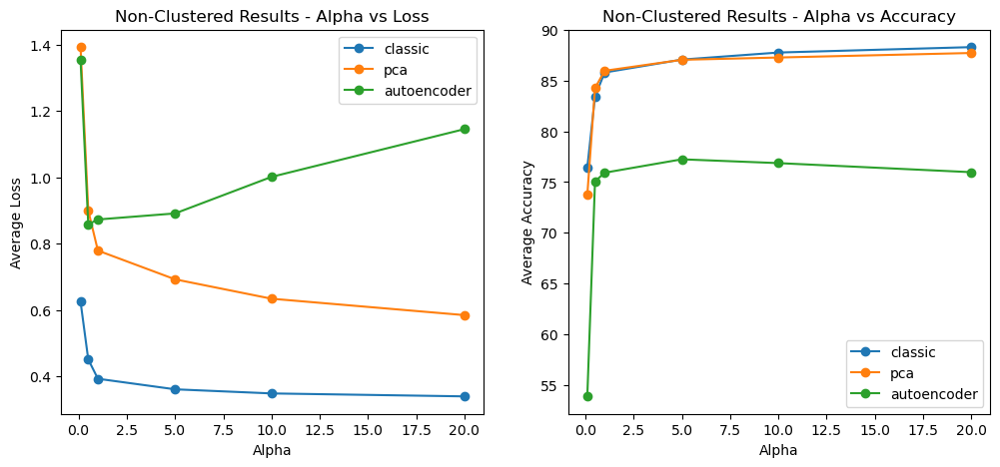


Clustered Results:
classic:
  Average Loss: {0.1: 0.5847040725708008, 0.5: 0.4500087135314942, 1: 0.3828379196166993, 5: 0.35671696853637697, 10: 0.3584933403015137, 20: 0.3452504592895508}
  Average Accuracy: {0.1: 77.6825, 0.5: 83.015, 1: 86.31, 5: 87.5175, 10: 87.495, 20: 88.44250000000001}
pca:
  Average Loss: {0.1: 1.0798530090332032, 0.5: 0.8428119155883789, 1: 0.73519363861084, 5: 0.6630848587036132, 10: 0.6099903015136718, 20: 0.5570095260620117}
  Average Accuracy: {0.1: 78.135, 0.5: 83.97999999999999, 1: 86.1925, 5: 87.08749999999999, 10: 87.27999999999999, 20: 87.54249999999999}
autoencoder:
  Average Loss: {0.1: 0.9493783172607422, 0.5: 0.8594836791992188, 1: 0.8598547119140625, 5: 0.9583121948242187, 10: 1.086783464050293, 20: 1.1820714660644531}
  Average Accuracy: {0.1: 69.2025, 0.5: 76.175, 1: 77.09, 5: 77.03999999999999, 10: 76.2125, 20: 76.1475}


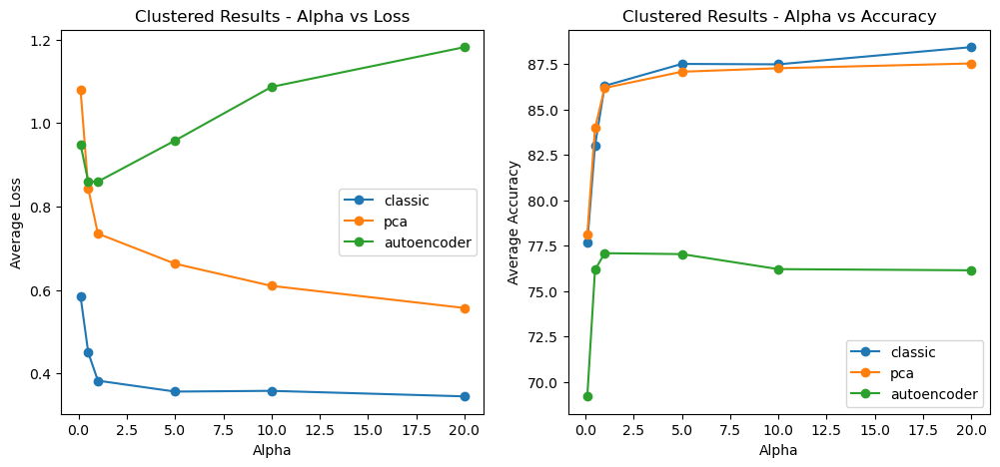

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def compute_final_metrics(metrics):
    final_loss = {alpha: data['losses'][-1] for alpha, data in metrics.items()}
    final_accuracy = {alpha: data['accuracy'][-1] for alpha, data in metrics.items()}
    final_precision = {alpha: data['precision'][-1] for alpha, data in metrics.items()}
    final_f1 = {alpha: data['f1'][-1] for alpha, data in metrics.items()}
    final_recall = {alpha: data['recall'][-1] for alpha, data in metrics.items()}

    total_time = {
        alpha: sum(data.get('TrainingTime', data.get('trainingTime', [0])))
        for alpha, data in metrics.items()
    }

    return final_loss, final_accuracy, final_precision, final_f1, final_recall, total_time

def print_results(results, title):
    print(f"\n{title}:")
    for method in results.keys():
        final_loss, final_accuracy, final_precision, final_f1, final_recall, total_time = compute_final_metrics(results[method])
        print(f"{method}:")
        print("  Final Loss:", final_loss)
        print("  Final Accuracy:", final_accuracy)
        print("  Final Precision:", final_precision)
        print("  Final F1 Score:", final_f1)
        print("  Final Recall:", final_recall)
        print("  Total Time:", total_time)

def plot_results(results, title, filename):
    plt.figure(figsize=(15, 10))

    metrics_names = ["Loss", "Accuracy", "Precision", "F1 Score", "Recall", "Total Time"]
    for i, metric in enumerate(metrics_names):
        plt.subplot(2, 3, i + 1)

        for method in results.keys():
            final_loss, final_accuracy, final_precision, final_f1, final_recall, total_time = compute_final_metrics(results[method])

            metric_values = {
                "Loss": final_loss,
                "Accuracy": final_accuracy,
                "Precision": final_precision,
                "F1 Score": final_f1,
                "Recall": final_recall,
                "Total Time": total_time
            }[metric]

            plt.plot(metric_values.keys(), metric_values.values(), marker='o', label=method)

        plt.xlabel('Alpha')
        plt.ylabel(metric)
        plt.title(f'{title} - Alpha vs {metric}')
        plt.legend()

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

print_results(results, "Non-Clustered Results")
plot_results(results, "Non-Clustered Results", "non_clustered_results.png")

print_results(clusteredResults, "Clustered Results")
plot_results(clusteredResults, "Clustered Results", "clustered_results.png")